# Visión por Computador - Práctica 3 - Extracción (y Emparejamiento) de Características y Registrado de Imágenes

#### 11 puntos   |   Fecha de entrega: 31 de Diciembre, 23:59   |   Forma de entrega: a través de la tarea creada en https://pradogrado2425.ugr.es/

### Estudiante: <mark>Mohammed LAHSSAINI NOUIJAH</mark>



<font color='blue'>En esta práctica aprenderás:

<font color='blue'>a) A detectar puntos de interés utilizando el detector de esquinas de Harris (Ejercicio 1).

<font color='blue'>b) A encontrar correspondencias entre los _keypoints_ (puntos de interés) de dos imágenes utilizando distintos descriptores (Ejercicio 2).

<font color='blue'>c) A componer un mosaico/panorama a partir de un conjunto de imágenes utilizando homografías (Ejercicio 3).

In [ ]:
# Let's start importing all background modules
# We start by getting access to the drive
from google.colab import drive
drive.mount('/content/drive', force_remount=True)
import sys,os
# change directory
%cd '/content/drive/My Drive'
# Let's import the python module exercises.py  to have access to its functions and Classes
get_image = lambda route: os.path.join('/content/drive/MyDrive/images/', route)
import numpy as np
from matplotlib import pyplot as plt
import cv2

Mounted at /content/drive
/content/drive/My Drive


In [ ]:
'''
This function receives a string with the filename of the image to read,
and a flag indicating if we want to read it in color/RGB (flagColor=1) or gray level (flagColor=0)

Example of use:
im1=readIm(get_image('apple.jpg'),0)

'''
def readIm(filename, flagColor=1):
  # cv2 reads BGR format
  im=cv2.imread(filename)
  # change to  RGB and return the image
  if(flagColor):
    return cv2.cvtColor(im, cv2.COLOR_BGR2RGB)
  # change from BGR to grayscale instead if flag is 0
  return cv2.cvtColor(im, cv2.COLOR_BGR2GRAY)

In [ ]:
'''
This function receives an array of arbitrary real numbers (that could include even negative values),
and returns an 'image' in the range [0,1].
flag_GLOBAL allows the user to normalize the whole image (including all channels) or to normalize
each channel/band independently.
'''
def rangeDisplay01(im, flag_GLOBAL= True):
  im = im.astype(float)
  if flag_GLOBAL:
    im = (im - im.min())/(im.max() - im.min())
  else:
    # bands normalization
    for band in range(im.shape[2]):
      im[:, :, band] = (im[:, :, band] - im[:, :, band].min())/(im[:, :, band].max() - im[:, :, band].min())
      # Note: remember that, for plt.imshow with RGB data, the valid range is [0..1] for floats and [0..255] for integers.
  return im

In [ ]:
'''
This function displays a single image, including a title, using a magnification factor.

Example of use:
im1=readIm(get_image('apple.jpg'),0)
displayIm(im1,'Manzana',0.5)

'''
def displayIm(im, title='Result',factor= 2):
  # First normalize range
  max=np.max(im)
  min=np.min(im)
  if min<0 or max>255:
    im=rangeDisplay01(im,flag_GLOBAL=True)
  if len(im.shape) == 3:
    # im es tribanda
    plt.imshow(im, cmap='jet')
  else:
    # im es monobanda
    plt.imshow(im, cmap='gray')
  figure_size = plt.gcf().get_size_inches()
  plt.gcf().set_size_inches(factor * figure_size)
  plt.title(title)
  plt.xticks([]), plt.yticks([]) # eliminamos numeración
  plt.show()

In [ ]:
'''
This function displays multiple images (including a title and using a magnification factor)
of equal size. The input to the function is a list of images.

Example of use:
im1=readIm(get_image('apple.jpg'),1)
images = [im1,im1,im1]

displayMI_ES(images, title='Manzanas',factor=1)

'''
def displayMI_ES(vim, title='Result',factor=2):
  # We set the maximun number of images to concatenate by columns
  maxcolumns=3
  # number of images to display
  numberim=len(vim)
  # The simplest case, one row: the maximum number of columns is larger than the images to stack
  # This is, by default, we put together the images column-wise
  if len(vim) < maxcolumns:
    out=vim[0]
    for item in range(1,len(vim)):
      #displayIm(out,str(item),1)
      out=np.hstack((out,vim[item]))

  # Else, if maxcolumns is smaller or equal than the number of images to stack
  else:
    # We check if all rows and columns are going to be 'busy', or if otherwise we need an extra-row
    if np.mod(len(vim),maxcolumns)== 0:
      maxrows=numberim//maxcolumns
    else:
      maxrows=numberim//maxcolumns+1

    # we build up the first block-row
    out=vim[0]
    for item in range(1,maxcolumns):
      out=np.hstack((out,vim[item]))
    # We build up the rest of block-rows
    for block in range(1,maxrows):
      #print(block)
      row=vim[block*maxcolumns]
      for item in range(1,maxcolumns):
        # We still have images to stack
        if block*maxcolumns+item < numberim:
          row=np.hstack((row,vim[block*maxcolumns+item]))
        # We do not have more images, and we have to fill with black
        else:
          row=np.hstack((row,np.zeros(vim[0].shape,dtype=vim[0].dtype)))
          #print(row.dtype)
          # if we don't include ',dtype=vim[0].dtype', np.zeros will include float
          # numbers in the matrix. This will make that the whole matrix will be
          # considered as floats, and values larger than 1 will be clipped to 1,
          # displaying an almost totally white image
      # add the new block-row
      out=np.vstack((out,row))
  return displayIm(out,title,factor)

In [ ]:
def GaussFunc(x,sigma):
    return (1 / (sigma * np.sqrt(2 * np.pi))) * np.exp(-0.5 * (x / sigma) ** 2)

def GaussDeriv1Func(x, sigma):
    return -(x / (sigma**2)) * GaussFunc(x, sigma)

def GaussDeriv2Func(x, sigma):
    return ((x**2 - sigma**2) / (sigma**4)) * GaussFunc(x, sigma)


gauss_size_from_sigma = lambda sigma: int(np.floor(2 * 3 * sigma + 1) // 2 * 2 + 1)
gauss_sigma_from_size = lambda sizeMask: (sizeMask-1)/6

def gaussianMask1D(sigma=0, sizeMask=0, order=0):
    # Crear un rango de valores centrado en 0
    half_size = sizeMask // 2
    x = np.linspace(-half_size, half_size, sizeMask)

    # Seleccionar la función según el orden
    if order == 0:
        mask = GaussFunc(x, sigma)
    elif order == 1:
        mask = GaussDeriv1Func(x, sigma)
    elif order == 2:
        mask = GaussDeriv2Func(x, sigma)
    else:
        raise ValueError("Order must be 0, 1, or 2")

    return mask

In [ ]:
def my2DConv(im, sigma, orders):
    # Calcula el tamaño de la máscara gaussiana a partir del valor de sigma
    sizeMask = gauss_size_from_sigma(sigma)

    # Si los órdenes de derivada son [0, 0], se aplica un suavizado gaussiano en ambas direcciones (X e Y)
    if orders == [0, 0]:  # Suavizado Gaussiano
        mask1Dx = gaussianMask1D(sigma=sigma, sizeMask=sizeMask, order=0)  # Suavizado en X
        mask1Dy = gaussianMask1D(sigma=sigma, sizeMask=sizeMask, order=0)  # Suavizado en Y

    # Si los órdenes son [1, 0], se aplica una derivada en la dirección X y un suavizado en Y
    elif orders == [1, 0]:  # Derivada en X
        mask1Dx = gaussianMask1D(sigma=sigma, sizeMask=sizeMask, order=1)  # Derivada en X
        mask1Dy = gaussianMask1D(sigma=sigma, sizeMask=sizeMask, order=0)  # Suavizado en Y

    # Si los órdenes son [0, 1], se aplica una derivada en Y y un suavizado en X
    elif orders == [0, 1]:  # Derivada en Y
        mask1Dx = gaussianMask1D(sigma=sigma, sizeMask=sizeMask, order=0)  # Suavizado en X
        mask1Dy = gaussianMask1D(sigma=sigma, sizeMask=sizeMask, order=1)  # Derivada en Y

    # Si los órdenes son [2, 0], se aplica una segunda derivada en X y un suavizado en Y
    elif orders == [2, 0]:  # Segunda derivada en X
        mask1Dx = gaussianMask1D(sigma=sigma, sizeMask=sizeMask, order=2)  # Segunda derivada en X
        mask1Dy = gaussianMask1D(sigma=sigma, sizeMask=sizeMask, order=0)  # Suavizado en Y

    # Si los órdenes son [0, 2], se aplica un suavizado en X y una segunda derivada en Y
    elif orders == [0, 2]:  # Segunda derivada en Y
        mask1Dx = gaussianMask1D(sigma=sigma, sizeMask=sizeMask, order=0)  # Suavizado en X
        mask1Dy = gaussianMask1D(sigma=sigma, sizeMask=sizeMask, order=2)  # Segunda derivada en Y

    # Si el orden no es válido, se lanza un error
    else:
        raise ValueError("Invalid derivative order. Must be [0, 0], [1, 0], [0, 1], [2, 0], or [0, 2].")

    # Se aplica la convolución separable en 2D utilizando las máscaras generadas para las direcciones X e Y
    return cv2.sepFilter2D(im, cv2.CV_64F, mask1Dx, mask1Dy)


# <font color='blue'>**Ejercicio 1:** Harris Corner Detector (3 puntos)

<font color='blue'>Implementar la detección de los 450-500 puntos Harris más fuertes en una imagen (es decir, como mínimo, se deben detectar/mostrar 450 puntos de interés y como máximo 500). Los pasos para implementar el detector de esquinas de Harris son los siguientes: \

> <font color='blue'>a) Fijar las escalas de diferenciación ($\sigma_D$) e integración ($\sigma_I$) en 1.5 y 2.25, respectivamente (aunque también se pueden emplear otros valores de sigma si el estudiante considera que mejoran el rendimiento; esto habría que justificarlo adecuadamente).

> <font color='blue'>b) Calcular las derivadas de la imagen. Para ello, se valorará positivamente el emplear las funciones creadas por el propio alumnado (en lugar de emplear directamente _cv2.getDerivKernels()_, _cv2.GaussianBlur()_, _cv2.filter2D()_ y similares).

> <font color='blue'>c) Calcular los tres términos de la _Second Moment Matrix_ ($SMM$) en cada píxel. Para ello, aplicar convolución con una máscara gaussiana con $\sigma_I$.

> <font color='blue'>d) A partir de la $SMM$, calcular el valor de Harris en cada píxel de la imagen.

> <font color='blue'>e) Aplique la supresión de no máximos mediante la función `corner_peaks()` (https://scikit-image.org/docs/stable/api/skimage.feature.html#skimage.feature.corner_peaks) del módulo `skimage.features`. El estudiante debe seleccionar una `min_distance` adecuada (`The minimal allowed distance separating peaks`) y un umbral de respuesta adecuado en el mapa de Harris para mantener solo la cantidad de _keypoints_ que se solicitan en el enunciado. El resultado será una lista de coordenadas $(x,y)$. Extraiga los valores en estas coordenadas y cree una lista de vectores $(x,y,value)$.

> <font color='blue'>f) Calcule la orientación principal para cada punto. Esto se hace suavizando ambas imágenes derivadas con un sigma suficientemente grande ($\sigma=3$) y, a continuación, calculando la orientación del gradiente en esos puntos.

> <font color='blue'>g) Cree una lista de _keypoints_ usando los puntos seleccionados. Un _keypoint_ suele representarse como un vector que incluye distintos elementos, por ejemplo, $(x,y,scale,orientation)$. En nuestro caso, un _keypoint_ es una estructura de OpenCV (`cv2.KeyPoint`), asociada a cada región detectada, que contendrá las coordenadas $x$ e $y$ del _keypoint_, así como su tamaño ($size$, es decir, el diámetro con el que se va a mostrar) y su orientacion ($angle$, calculada en el paso anterior). El parámetro $size$ de _KeyPoint()_, es decir, el diámetro del _keypoint_ mostrado, debe ser suficientemente grande como para ser visualizado adecuadamente. Una posibilidad es emplear `size=4*np.floor(3*sigmaI)+1`

> <font color='blue'>h) Dibuje los puntos sobre la imagen de entrada usando la función `drawKeyPoints()` (https://docs.opencv.org/4.x/d4/d5d/group__features2d__draw.html#ga5d2bafe8c1c45289bc3403a40fb88920), y los _flags_ `cv2.DRAW_MATCHES_FLAGS_DRAW_OVER_OUTIMG+cv2.DRAW_MATCHES_FLAGS_DRAW_RICH_KEYPOINTS`.

<font color='blue'>Se deben calcular los puntos de Harris sobre la imagen `IMG_20220312_102944_S.jpg`, y se debe mostrar:
* <font color='blue'>El mapa de respuestas de Harris (valor de Harris) en cada píxel de la imagen,
* <font color='blue'>el mapa de Harris umbralizado, es decir, una vez aplicado supresión de no máximos y un umbral mínimo de respuesta adecuado para obtener el número de puntos de interés solicitados,
* <font color='blue'>y la imagen de entrada con los keypoints finales, junto con el número exacto de _keypoints_ detectados (es decir, es necesario hacer un `print()` con el número de puntos de Harris).





## Función `derivatives`

Esta función calcula las derivadas de la imagen en las direcciones `x` e `y` aplicando un suavizado gaussiano.

### Detalles de implementación
1. **Entrada**:
   - `im`: Imagen en escala de grises.
   - `sigmaD`: Escala de diferenciación (sigma) para el suavizado.
2. **Proceso**:
   - Se realiza una convolución 2D con derivadas gaussianas en las direcciones `x` e `y`.
   - Esto resalta los bordes verticales y horizontales en la imagen.
3. **Salida**:
   - `dx`: Imagen derivada respecto a `x`.
   - `dy`: Imagen derivada respecto a `y`.


In [ ]:
def derivatives(im, sigmaD):
    """
    Calcula las derivadas Ix e Iy de la imagen im,
    aplicando un suavizado gaussiano con sigmaD y derivadas gaussianas.
    Retorna dx, dy.
    """
    dx = my2DConv(im, sigmaD, [1,0])  # derivada respecto a x
    dy = my2DConv(im, sigmaD, [0,1])  # derivada respecto a y
    return dx, dy


## Función `HarrisMap`

Esta función calcula el mapa de respuesta de Harris, utilizado para detectar esquinas en una imagen.

### Detalles de implementación
1. **Entradas**:
   - `dx`, `dy`: Derivadas de la imagen calculadas previamente.
   - `sigmaI`: Escala de integración (sigma) para el suavizado.
   - `k`: Constante de ajuste para la fórmula de Harris (valor típico: 0.04).
2. **Proceso**:
   - Se calculan los elementos de la matriz de segundo momento (SMM):
     - `A = G_sigmaI * (dx^2)`
     - `B = G_sigmaI * (dx * dy)`
     - `C = G_sigmaI * (dy^2)`
   - Se obtiene el determinante y la traza de la matriz:
     - `det(M) = A * C - B^2`
     - `trace(M) = A + C`
   - Se calcula el mapa de respuesta de Harris:
     - `R = det(M) - k * (trace(M))^2`
3. **Salida**:
   - `HMap`: Mapa de respuesta de Harris.


In [ ]:
def HarrisMap(dx, dy, sigmaI, k=0.04):
    """
    Calcula el mapa de respuesta de Harris.
    A partir de dx, dy:
    - Calculamos A = G_sigmaI * (dx^2)
    - Calculamos B = G_sigmaI * (dx * dy)
    - Calculamos C = G_sigmaI * (dy^2)

    R = det(M) - k (trace(M))^2
    con det(M)=A*C - B^2 y trace(M)=A+C
    """
    Ix2 = dx*dx
    Iy2 = dy*dy
    Ixy = dx*dy

    A = my2DConv(Ix2, sigmaI, [0,0])
    B = my2DConv(Ixy, sigmaI, [0,0])
    C = my2DConv(Iy2, sigmaI, [0,0])

    detM = A*C - B**2
    traceM = A + C
    HMap = detM - k*(traceM**2)

    return HMap

## Función `NonMaximaSuppression`

Esta función implementa la supresión de no-máximos en el mapa de Harris para seleccionar las esquinas más significativas.

### Detalles de implementación
1. **Entradas**:
   - `harrisMap`: Mapa de respuesta de Harris.
   - `min_distance`: Distancia mínima entre picos detectados (en píxeles).
   - `threshold`: Valor mínimo de respuesta para considerar un punto como esquina.
2. **Proceso**:
   - Se utiliza `corner_peaks` de la librería `skimage.feature` para encontrar los picos locales en el mapa de Harris que cumplen con el umbral y la distancia mínima especificados.
   - Si el número de picos detectados excede el número deseado, se seleccionan los más fuertes basándose en los valores de respuesta de Harris.
3. **Salida**:
   - Una lista de coordenadas `[ (y, x), ... ]` representando las ubicaciones de las esquinas seleccionadas.


In [ ]:
def NonMaximaSuppression(harrisMap, min_distance, threshold):
    """
    Aplica la supresión de no-máximos usando corner_peaks de skimage.
    Retorna un array con las coordenadas [ (y,x), ... ] de las esquinas.

    Args:
    - harrisMap: Mapa de respuesta de Harris.
    - min_distance: Distancia mínima entre picos.
    - threshold: Valor mínimo de respuesta para considerar una esquina.

    Returns:
    - coords: Lista de coordenadas [ (y, x) ] de las esquinas seleccionadas.
    """
    # Detectar picos locales en el mapa de Harris
    coords = corner_peaks(harrisMap, min_distance=min_distance, threshold_abs=threshold)

    # Si hay más puntos de los deseados, seleccionamos los más fuertes
    if coords.shape[0] > desired_points:
        # Extraemos los valores de Harris correspondientes a las coordenadas detectadas
        values = [harrisMap[y, x] for (y, x) in coords]
        values = np.array(values)

        # Ordenamos los valores de mayor a menor
        idx_sorted = np.argsort(values)[::-1]

        # Seleccionamos las coordenadas de los puntos más fuertes
        idx_strongest = idx_sorted[:desired_points]
        coords = coords[idx_strongest]

    return coords


## Función `orientation`

Esta función calcula el mapa de orientaciones del gradiente, que es crucial para describir la dirección principal de cada esquina detectada.

### Detalles de implementación
1. **Entradas**:
   - `dx`: Derivada de la imagen en la dirección `x`.
   - `dy`: Derivada de la imagen en la dirección `y`.
2. **Proceso**:
   - Suavizamos las derivadas `dx` y `dy` utilizando un filtro gaussiano con `sigma = 3`.
   - Calculamos la orientación del gradiente en cada píxel con la fórmula:
     \[
     \theta = \arctan2(dy_{\text{suav}}, dx_{\text{suav}})
     \]
3. **Salida**:
   - `theta`: Mapa de orientaciones del gradiente en radianes.


In [ ]:
def orientation(dx, dy):
    """
    Calcula el mapa de orientaciones del gradiente.
    Primero suavizamos dx, dy con sigma=3 para reducir ruido,
    luego theta = arctan2(dy_suav, dx_suav).

    Args:
    - dx: Derivada en la dirección x.
    - dy: Derivada en la dirección y.

    Returns:
    - theta: Mapa de orientaciones del gradiente (en radianes).
    """
    sigma_orient = 3
    dx_s = my2DConv(dx, sigma_orient, [0, 0])  # Suavizado de dx
    dy_s = my2DConv(dy, sigma_orient, [0, 0])  # Suavizado de dy
    theta = np.arctan2(dy_s, dx_s)  # Orientación del gradiente
    return theta


## Función `keyPoints`

Esta función genera una lista de objetos `cv2.KeyPoint` que representan cada esquina detectada, incluyendo información como posición, tamaño y orientación.

### Detalles de implementación
1. **Entradas**:
   - `coord`: Lista de coordenadas `(y, x)` de los puntos detectados.
   - `theta`: Mapa de orientaciones del gradiente.
   - `size`: Tamaño del keypoint calculado como \( \text{size} = 4 \cdot \lfloor 3 \cdot \sigma_I \rfloor + 1 \).
2. **Proceso**:
   - Para cada coordenada `(y, x)`, extraemos la orientación del gradiente en grados usando `np.degrees(theta[y, x])`.
   - Creamos un objeto `cv2.KeyPoint` con los atributos:
     - `x`, `y`: Posición del keypoint.
     - `size`: Tamaño visual del keypoint.
     - `angle`: Orientación del keypoint en grados.
3. **Salida**:
   - Lista de keypoints en formato `cv2.KeyPoint`.


In [ ]:
def keyPoints(coord, theta, size):
    """
    Crea objetos cv2.KeyPoint para cada coordenada y orientación.

    Args:
    - coord: Lista de coordenadas (y, x) de las esquinas detectadas.
    - theta: Mapa de orientaciones del gradiente.
    - size: Tamaño visual del keypoint.

    Returns:
    - keypoints: Lista de objetos cv2.KeyPoint.
    """
    keypoints = []
    for (y, x) in coord:
        ang_degrees = np.degrees(theta[y, x])  # Convertir orientación a grados
        kp = cv2.KeyPoint(float(x), float(y), float(size), float(ang_degrees))
        keypoints.append(kp)
    return keypoints


## Configuración de Parámetros

1. **`sigmaD`**: Escala de diferenciación, utilizada para calcular las derivadas de la imagen.
   - Valor asignado: `1.5`.

2. **`sigmaI`**: Escala de integración, utilizada para suavizar la matriz de segundo momento.
   - Valor asignado: `2.25`.

3. **`k`**: Constante de ajuste en la fórmula de Harris.
   - Valor asignado: `0.04`.

4. **`min_distance`**: Distancia mínima en píxeles entre picos seleccionados durante la supresión de no-máximos.
   - Valor asignado: `5`.

5. **`threshold_abs`**: Umbral absoluto para descartar puntos de interés con valores de respuesta bajos en el mapa de Harris.
   - Valor asignado: `0.01`.

6. **`desired_points`**: Número máximo deseado de puntos de interés seleccionados.
   - Valor asignado: `500`.

Estos valores se utilizan para configurar y controlar el comportamiento de las funciones implementadas en el detector de esquinas.


In [ ]:
# Importación de librerías necesarias
from skimage.feature import corner_peaks
import matplotlib.pyplot as plt

# Configuración de parámetros
sigmaD = 1.5  # Escala de diferenciación
sigmaI = 2.25  # Escala de integración
k = 0.04  # Constante de ajuste para la respuesta de Harris
min_distance = 5  # Distancia mínima entre puntos detectados
threshold_abs = 0.01  # Umbral mínimo de respuesta
desired_points = 500  # Número deseado de puntos de interés

## Harris Map

En esta sección, calculamos y mostramos el mapa de respuesta de Harris, que representa la fuerza de las esquinas en cada píxel.

### Pasos:
1. Calcular las derivadas de la imagen en las direcciones `x` e `y` utilizando la función `derivatives`.
2. Generar el mapa de Harris utilizando la función `HarrisMap`.
3. Visualizar el mapa de respuesta.


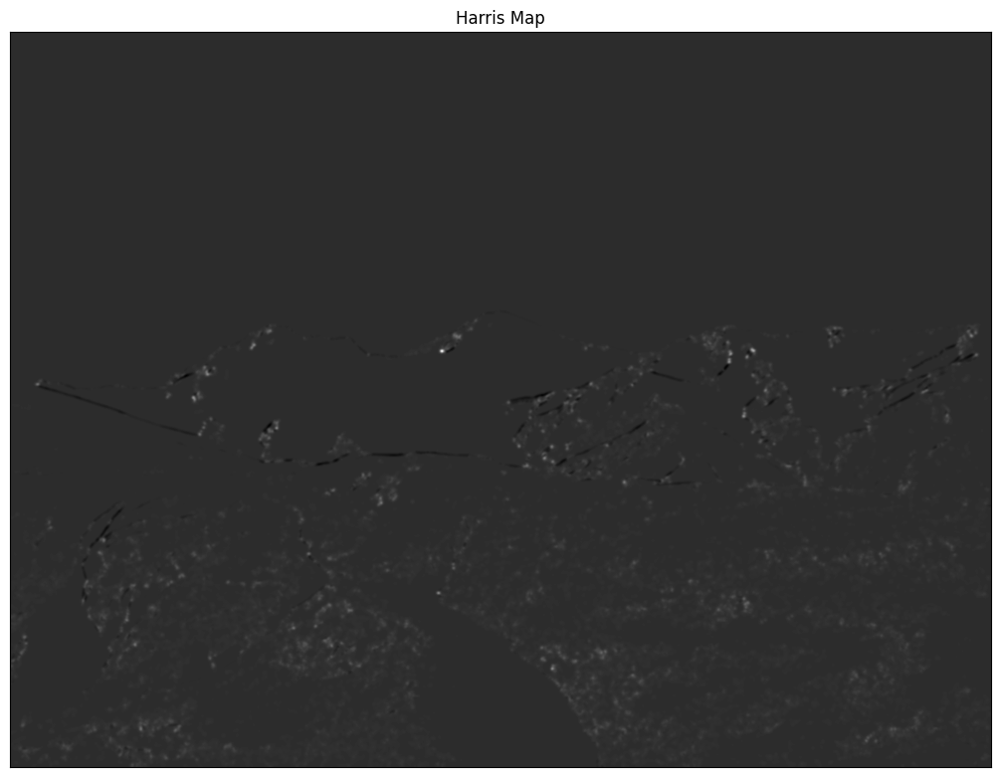

In [ ]:
img = readIm(get_image('IMG_20220312_102944_S.jpg'),1)   # Imagen en RGB
im_gray = readIm(get_image('IMG_20220312_102944_S.jpg'),0)  # En escala de grises

# Cálculo de derivadas
dx, dy = derivatives(im_gray, sigmaD)

# Cálculo del mapa de Harris
harrisMap = HarrisMap(dx, dy, sigmaI, k)

# Mostrar el mapa de Harris completo
displayIm(harrisMap,'Harris Map', 2)

## Harris Map Thresholded

En esta sección, aplicamos la supresión de no-máximos al mapa de Harris para identificar los puntos de interés más relevantes.

### Pasos:
1. Usar la función `NonMaximaSuppression` para seleccionar los picos locales más fuertes.
2. Escalar los valores de respuesta de Harris en los puntos seleccionados para representarlos visualmente con diferentes radios.
3. Visualizar el mapa umbralizado con los puntos detectados marcados.


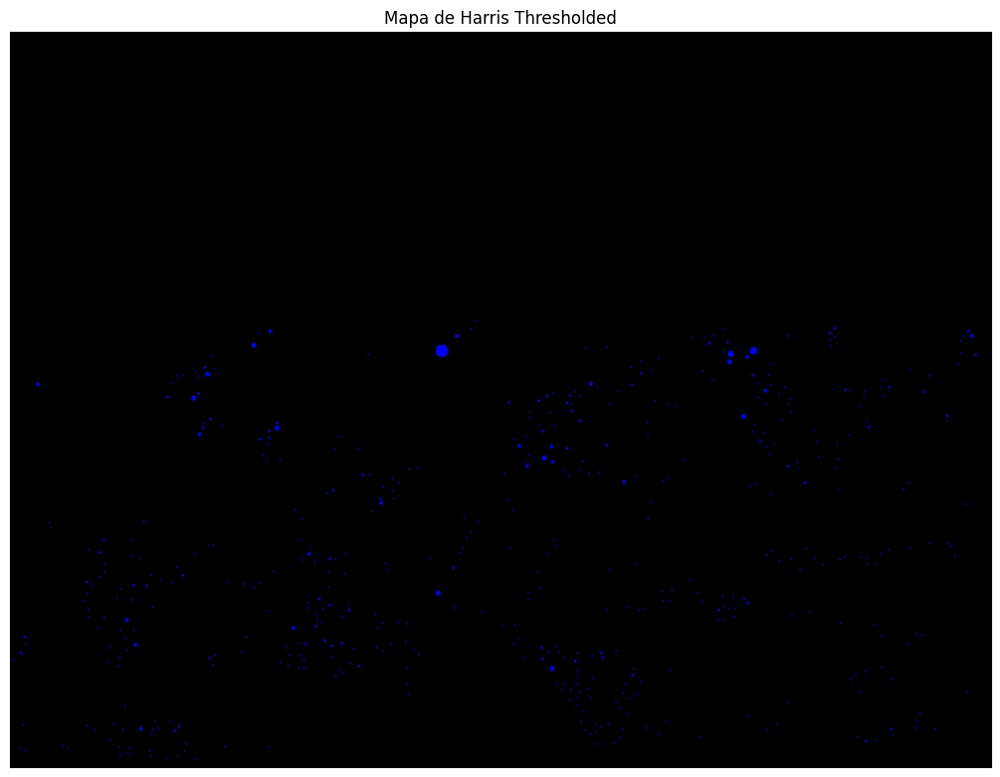

In [ ]:
# Supresión de no-máximos
coords = NonMaximaSuppression(harrisMap, min_distance, threshold_abs)

# Extraer valores del mapa de Harris en las coordenadas detectadas
values = [harrisMap[y, x] for (y, x) in coords]

# Obtener los valores mínimo y máximo
val_min = min(values)
val_max = max(values)

# Crear una imagen para visualizar los puntos detectados con radios escalados
harris_thresh = np.zeros((harrisMap.shape[0], harrisMap.shape[1], 3), dtype=np.uint8)

# Definir un rango de radios
min_radius = 1
max_radius = 10

# Dibujar círculos en las coordenadas detectadas
for (y, x) in coords:
    val = harrisMap[y, x]
    radius = int(min_radius + (val - val_min) * (max_radius - min_radius) / (val_max - val_min))
    cv2.circle(harris_thresh, (x, y), radius=radius, color=(0, 0, 255), thickness=-1)

# Visualizar el mapa umbralizado
displayIm(harris_thresh, 'Mapa de Harris Thresholded', factor=2)


## Harris Keypoints

En esta sección, calculamos las orientaciones de los puntos detectados, generamos keypoints y los mostramos superpuestos en la imagen original.

### Pasos:
1. Calcular el mapa de orientaciones del gradiente con la función `orientation`.
2. Generar keypoints a partir de las coordenadas detectadas, orientaciones y tamaños.
3. Dibujar los keypoints en la imagen original para visualizarlos.
4. Mostrar estadísticas del número de keypoints detectados.


Número de keypoints detectados: 500
Image shape: (1200, 1600, 3) Dtype: uint8


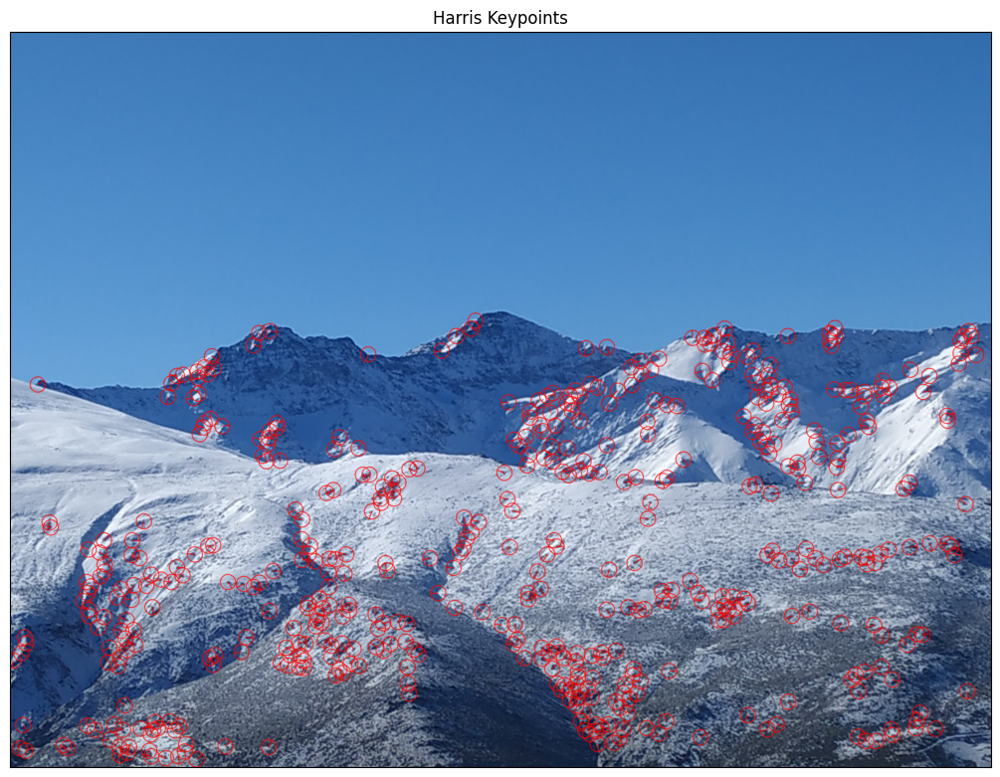

In [ ]:
# Cálculo de orientaciones
theta = orientation(dx, dy)

# Cálculo del size para los keypoints
size = 4*np.floor(3*sigmaI)+1

# Crear keypoints
kps = keyPoints(coords, theta, size)

print("Número de keypoints detectados:", len(kps))
print("Image shape:", img.shape, "Dtype:", img.dtype)


# Dibujar keypoints
output_image = cv2.drawKeypoints(img, kps, 0, (255,0,0),
                                 flags=cv2.DRAW_MATCHES_FLAGS_DRAW_RICH_KEYPOINTS)

displayIm(output_image, 'Harris Keypoints', factor=2)

# <font color='blue'>**Ejercicio 2:** Emparejamiento de _keypoints_ entre imágenes usando descriptores SIFT, HOG y LBP (3 puntos)

<font color='blue'>En este apartado, partiendo de un detector de características (SIFT) y tres descriptores de características (SIFT, HOG y LBP), vamos a calcular el emparejamiento entre _keypoints_ de dos imágenes. Las imágenes con las que se trabajará en este ejercicio serán `IMG_20220312_102940_S.jpg` y `IMG_20220312_102944_S.jpg`. Estas imágenes son de $1200\times1600$ pero, tras leerlas, se debe reducir su tamaño a la mitad ($600\times800$). Es en esta última dimensionalidad en la que realizaremos todo el ejercicio y visualizaremos las imágenes. Y, a continuación, debemos pasarlas a escala de grises. Nota importante: del mismo modo que se calculan _keypoints_ y descriptores en escala de grises, luego los matches/emparejamientos sí se visualizan sobre las imágenes originales en color.

## <font color='blue'>SIFT (Scale-invariant feature transform)

<font color='blue'>En un primer momento, el alumnado debe aplicar el algoritmo SIFT a ambas imágenes para extraer los puntos de interés (_keypoints_) y los descriptores (https://docs.opencv.org/3.4/dc/dc3/tutorial_py_matcher.html). Luego, vamos a emplear tres criterios de emparejamiento: _brute force_ (`cv2.BFMatcher`), _brute force with cross-check_ (`cv2.BFMatcher` con `crossCheck=True`) y el _Lowe's ratio test_ (`knnMatch`) para calcular los emparejamientos y mostrar los 100 mejores matches utilizando la función `cv2.drawMatches`.

<font color='blue'>En los siguientes apartados, emplearemos exactamente los mismos _keypoints_ detectados por SIFT para calcular otros descriptores en dichas localizaciones y comparar los resultados obtenidos. En los próximos apartados también se utilizarán y compararán los mismos tres criterios de emparejamiento indicados (_BF_, _BF+CC_ y _Lowe's ratio test_).

### Función `siftPoints`

Esta función utiliza el algoritmo SIFT para detectar keypoints y calcular descriptores en una imagen.

### Detalles de implementación
1. **Entrada**:
   - `im`: Imagen en escala de grises sobre la que se detectarán los keypoints.
   - `nfeatures`: Número máximo de características a detectar (por defecto, 5000).
2. **Proceso**:
   - Se crea un objeto SIFT utilizando `cv2.SIFT_create`.
   - Se detectan keypoints y se calculan descriptores mediante `sift.detectAndCompute`.
3. **Salida**:
   - `kp`: Lista de keypoints detectados.
   - `ds`: Descriptores de cada keypoint.


In [ ]:
def siftPoints(im, nfeatures=5000):
    # Crear el objeto SIFT con el número de características especificado
    sift = cv2.SIFT_create(nfeatures=nfeatures)

    # Detectar keypoints y calcular descriptores SIFT en la imagen de entrada
    # im debe ser una imagen en escala de grises
    kp, ds = sift.detectAndCompute(im, None)

    return kp, ds


### Función `showKP`

1. Dibuja los keypoints detectados sobre una imagen.
2. Utiliza `cv2.drawKeypoints` con el flag `DRAW_RICH_KEYPOINTS` para mostrar tamaño y orientación de cada keypoint.
3. Muestra la imagen resultante utilizando `displayIm`.

### Parámetros:
- `im`: Imagen original sobre la que se dibujarán los keypoints.
- `kp`: Lista de keypoints detectados.
- `title`: Título de la visualización.


In [ ]:
def showKP(im, kp, title):
    """
    Visualiza los keypoints detectados sobre la imagen original.

    Args:
    - im: Imagen original (RGB o escala de grises).
    - kp: Lista de keypoints detectados.
    - title: Título para la visualización.
    """
    # Dibujar los keypoints sobre la imagen
    img = cv2.drawKeypoints(im, kp, None, flags=cv2.DRAW_MATCHES_FLAGS_DRAW_RICH_KEYPOINTS)

    # Mostrar la imagen con los keypoints
    displayIm(img, title, 1)


### Función `showMatches`

1. Dibuja los matches entre dos conjuntos de keypoints detectados en dos imágenes.
2. Selecciona los `N` mejores matches ordenados por distancia.
3. Utiliza `cv2.drawMatches` para mostrar las conexiones entre los puntos emparejados.

### Parámetros:
- `im1`: Primera imagen (original en RGB o escala de grises).
- `kp1`: Keypoints de la primera imagen.
- `im2`: Segunda imagen (original en RGB o escala de grises).
- `kp2`: Keypoints de la segunda imagen.
- `matches`: Lista de matches entre los descriptores de ambas imágenes.
- `N`: Número de matches a visualizar.
- `title`: Título para la visualización.


In [ ]:
def showMatches(im1, kp1, im2, kp2, matches, N, title='Matches'):
    """
    Visualiza los emparejamientos entre dos imágenes.

    Args:
    - im1: Primera imagen original.
    - kp1: Lista de keypoints de la primera imagen.
    - im2: Segunda imagen original.
    - kp2: Lista de keypoints de la segunda imagen.
    - matches: Lista de matches entre los descriptores de las imágenes.
    - N: Número de matches a mostrar.
    - title: Título de la visualización.
    """
    # Seleccionar los N mejores matches
    best_matches = matches[:N]

    # Dibujar los matches
    imBF = cv2.drawMatches(im1, kp1, im2, kp2, best_matches, None,
                           flags=cv2.DrawMatchesFlags_NOT_DRAW_SINGLE_POINTS)

    # Mostrar la imagen con los matches
    displayIm(imBF, title, 2)


### Función `matching`

La función `matching` compara los descriptores de dos imágenes y devuelve los matches entre ellos utilizando diferentes estrategias. El propósito de esta función es encontrar puntos correspondientes entre dos imágenes, lo cual es una tarea clave en aplicaciones de visión por computadora como la creación de mosaicos, la detección de objetos, y el seguimiento de características.

### Métodos de Emparejamiento

La función `matching` soporta tres modos diferentes para realizar el emparejamiento de descriptores:

#### 1. **Brute Force (BF)**

- **Descripción**: El emparejamiento "Brute Force" es el enfoque más simple para comparar descriptores. En este método, cada descriptor de la primera imagen se compara con todos los descriptores de la segunda imagen, y se elige el match con la menor distancia.
  
- **Funcionamiento**:
  - Se utiliza el método `cv2.BFMatcher` con el tipo de norma L2 (`cv2.NORM_L2`), que calcula la distancia Euclidiana entre los descriptores.
  - Los matches se ordenan en función de la distancia entre los descriptores, de modo que el match con la menor distancia es considerado el más cercano.
  
- **Ventajas**:
  - Fácil de implementar y rápido para conjuntos de datos pequeños.
  
- **Desventajas**:
  - No tiene mecanismos para filtrar coincidencias incorrectas (falsos positivos).

#### 2. **Brute Force + Cross-Check (BF+CC)**
- **Descripción**: Este método es una variante del emparejamiento "Brute Force" que incluye una validación cruzada. El concepto detrás del cross-checking es que, para que un match sea considerado válido, debe ser mutuo. Es decir, si un descriptor de la primera imagen se empareja con un descriptor de la segunda imagen, este último también debe emparejarse con el primero.

- **Funcionamiento:**

  - Similar al método "Brute Force", pero con el parámetro crossCheck=True en el BFMatcher.
  - El cross-checking garantiza que solo se mantengan los matches donde ambos descriptores se emparejan entre sí.

- **Ventajas:**

  - Mejora la precisión de los emparejamientos al eliminar coincidencias inconsistentes.
- **Desventajas:**
  - Puede reducir la cantidad de matches válidos, ya que filtra más estrictamente las coincidencias.

#### 3. **Lowe's Ratio Test (KNN)**

- **Descripción**:
  - El test de ratio de Lowe es un método basado en el emparejamiento utilizando el algoritmo KNN (K-nearest neighbors). Lowe sugirió este método como una forma de filtrar matches incorrectos. La idea es comparar las dos mejores coincidencias para cada descriptor y asegurarse de que la distancia entre la mejor coincidencia sea suficientemente menor que la distancia de la segunda mejor coincidencia.

- **Funcionamiento:**
  - Se utiliza cv2.BFMatcher sin cross-checking para encontrar los dos mejores matches para cada descriptor, y luego se filtra si la relación entre la distancia del mejor match y la del segundo mejor es suficientemente alta (usualmente se utiliza un ratio de 0.75 como valor recomendado por Lowe).
Esto ayuda a reducir los falsos positivos al eliminar coincidencias ambiguas.

- **Ventajas:**
  - Mejor que el emparejamiento "Brute Force" en términos de precisión, ya que filtra coincidencias con un ratio significativo.
  - Utiliza la idea de que un descriptor debería tener una correspondencia mucho más cercana que la segunda mejor opción.

- **Desventajas:**

  - Puede ser más lento que los otros métodos, ya que requiere encontrar dos matches para cada descriptor y luego filtrar los que no cumplen el criterio de Lowe.

### Parámetros:
 - `ds1`: Descriptores de la primera imagen. Normalmente son generados por un detector de características como SIFT o ORB.
  - `ds2`: Descriptores de la segunda imagen.
  - `FlagMode`: Modo de emparejamiento a utilizar. Los valores posibles son:
    - 'BF': Emparejamiento Brute Force sin validación cruzada.
    - 'BF+CC': Emparejamiento Brute Force con validación cruzada (cross-check).
    - 'KNN': Emparejamiento utilizando el test de Lowe (ratio test) con el algoritmo KNN.

### Retorno
La función devuelve una lista de los matches entre los descriptores de las dos imágenes, ordenados por distancia (de menor a mayor). Cada match es un objeto que contiene dos descriptores emparejados y la distancia entre ellos.


In [ ]:
def matching(ds1, ds2, FlagMode='BF+CC'):
    """
    Empareja descriptores de dos imágenes utilizando diferentes métodos.

    Args:
    - ds1: Descriptores de la primera imagen.
    - ds2: Descriptores de la segunda imagen.
    - FlagMode: Modo de emparejamiento ('BF', 'BF+CC', 'KNN').

    Returns:
    - Lista de matches entre los descriptores.
    """
    # Emparejamiento Brute Force
    if FlagMode == 'BF':
        bf = cv2.BFMatcher(cv2.NORM_L2, crossCheck=False)
        matches = bf.match(ds1, ds2)
        return sorted(matches, key=lambda x: x.distance)

    # Emparejamiento Brute Force + Cross-Check
    elif FlagMode == 'BF+CC':
        bf = cv2.BFMatcher(cv2.NORM_L2, crossCheck=True)
        matches = bf.match(ds1, ds2)
        return sorted(matches, key=lambda x: x.distance)

    # Lowe's Ratio Test con KNN
    elif FlagMode == 'KNN':
        bf = cv2.BFMatcher(cv2.NORM_L2)
        knn_matches = bf.knnMatch(ds1, ds2, k=2)
        good = []
        ratio = 0.75  # Ratio recomendado por Lowe
        for m, n in knn_matches:
            if m.distance < ratio * n.distance:
                good.append(m)
        return sorted(good, key=lambda x: x.distance)

    # Modo inválido
    else:
        print('Error in Matching mode')
        return []


### Procesamiento de Imágenes y Detección de Keypoints

### Pasos:
1. **Cargar imágenes**:
   - Se cargan las imágenes originales a partir de sus rutas y se redimensionan a la mitad para facilitar el procesamiento.
   - Se convierten a escala de grises, ya que SIFT opera en este formato.
2. **Detectar keypoints y descriptores**:
   - Se utilizan las funciones previamente implementadas para aplicar el algoritmo SIFT y calcular los keypoints y descriptores.
3. **Visualizar resultados**:
   - Se muestra cada imagen con los keypoints detectados, representados con círculos que indican la escala y orientación.


In [ ]:
numberOfmatches = 100
N = 100

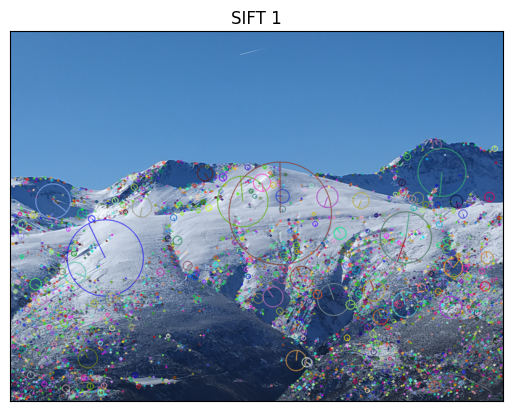

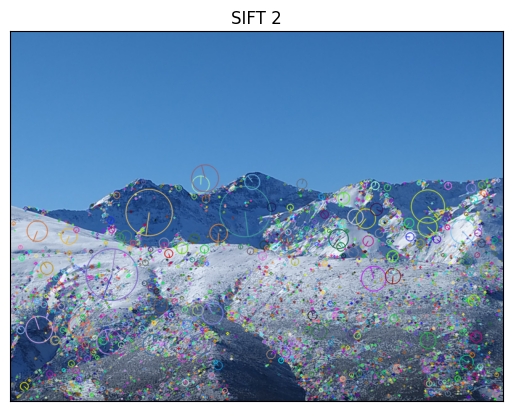

In [ ]:
# Cargar y redimensionar las imágenes
img1 = cv2.resize(readIm(get_image('IMG_20220312_102940_S.jpg'), 1), (0, 0), fx=0.5, fy=0.5)
im1 = cv2.cvtColor(img1, cv2.COLOR_RGB2GRAY)  # Convertir a escala de grises

img2 = cv2.resize(readIm(get_image('IMG_20220312_102944_S.jpg'), 1), (0, 0), fx=0.5, fy=0.5)
im2 = cv2.cvtColor(img2, cv2.COLOR_RGB2GRAY)  # Convertir a escala de grises

# Obtener keypoints y descriptores con SIFT
kp1, ds1 = siftPoints(im1)  # Imagen 1
kp2, ds2 = siftPoints(im2)  # Imagen 2

# Mostrar keypoints detectados
showKP(img1, kp1, 'SIFT 1')
showKP(img2, kp2, 'SIFT 2')


#### Resultados de las Imágenes Visualizadas

- SIFT 1 (Imagen 1):

  - La distribución de los keypoints se concentra en regiones con mayor textura y contraste, como las crestas montañosas y los bordes de las áreas nevadas.
  - La cantidad de keypoints detectados es alta, lo que asegura una buena representación de las características importantes de la imagen.

- SIFT 2 (Imagen 2):

  - Similar a la primera imagen, se observa una densa cobertura de keypoints en las áreas montañosas.
  - Los círculos varían en tamaño y orientación, indicando la capacidad de SIFT para detectar características en múltiples escalas y direcciones.

### Emparejamientos de Descriptores

### Pasos:
1. **Emparejar descriptores utilizando tres métodos diferentes**:
   - **Brute Force (BF)**: Emparejamiento directo sin validación cruzada.
   - **Brute Force + Cross-Check (BF+CC)**: Filtra matches inconsistentes validando en ambas direcciones.
   - **KNN (Lowe's ratio test)**: Filtra matches utilizando el Lowe's ratio test para evitar emparejamientos ambiguos.
2. **Visualizar resultados**:
   - Mostrar los 100 mejores matches para cada método.
   - Utilizar la función `showMatches` para dibujar los matches detectados sobre las imágenes originales.


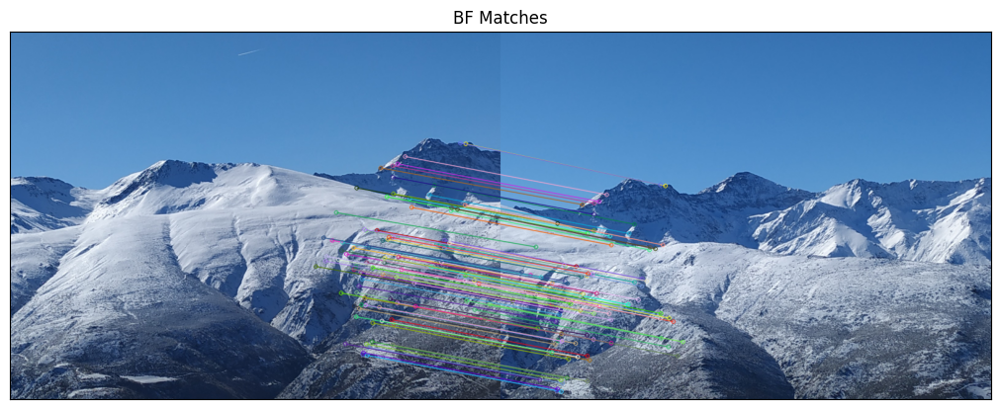

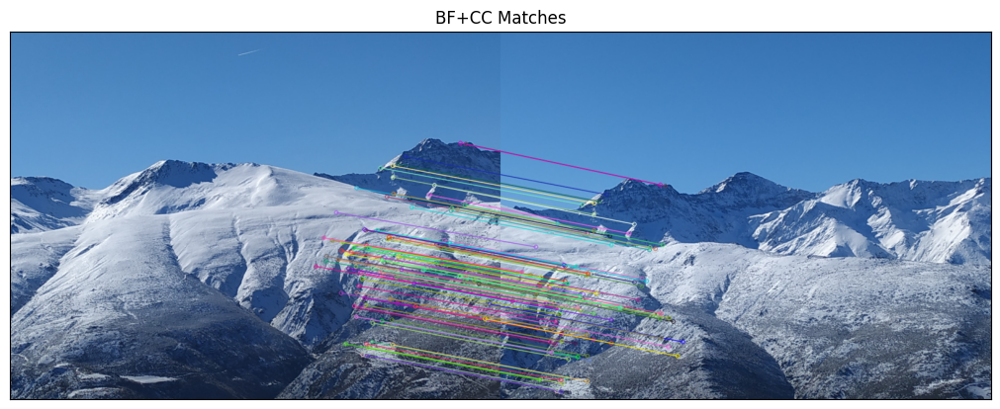

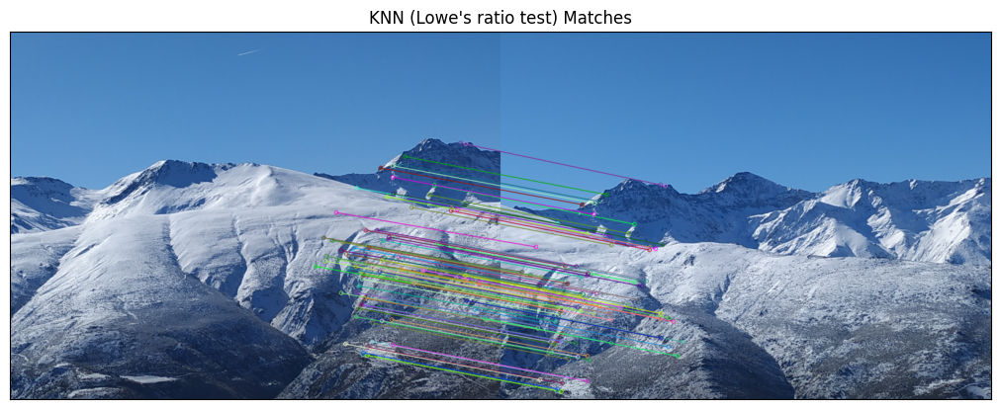

In [ ]:
# Emparejamientos con BF
matches_BF = matching(ds1, ds2, FlagMode='BF')
showMatches(img1, kp1, img2, kp2, matches_BF, numberOfmatches, title='BF Matches')

# Emparejamientos con BF+CC (cross-check)
matches_BFCC = matching(ds1, ds2, FlagMode='BF+CC')
showMatches(img1, kp1, img2, kp2, matches_BFCC, numberOfmatches, title='BF+CC Matches')

# Emparejamientos con KNN (Lowe's ratio test)
matches_KNN = matching(ds1, ds2, FlagMode='KNN')
showMatches(img1, kp1, img2, kp2, matches_KNN, numberOfmatches, title="KNN (Lowe's ratio test) Matches")

#### **Análisis de los Resultados**

---

### **1. BF Matches**


#### Descripción:
- El método Brute Force (BF) ha detectado una gran cantidad de matches entre las dos imágenes.
- Los matches se conectan principalmente entre puntos con características similares en ambas imágenes, como crestas montañosas o bordes prominentes.

#### Observaciones:
- Aunque se detectan muchos matches, algunos de ellos no son precisos y conectan puntos que visualmente no corresponden.
- La ausencia de validación cruzada permite matches inconsistentes.

#### Conclusión:
- El método BF proporciona una buena cantidad de matches, pero incluye emparejamientos incorrectos que podrían afectar tareas posteriores como la estimación de transformaciones.

---

### **2. BF+CC Matches**

#### Descripción:
- Este método aplica validación cruzada (Cross-Check), lo que elimina matches inconsistentes.
- La cantidad total de matches es menor comparada con el método BF puro.

#### Observaciones:
- Los matches se concentran en áreas con características bien definidas y de alto contraste.
- Hay menos conexiones incorrectas en comparación con BF.

#### Conclusión:
- BF+CC mejora la precisión de los matches eliminando los inconsistentes, pero a costa de reducir el número total de matches.

---

### **3. KNN (Lowe's Ratio Test) Matches**

#### Descripción:
- Utiliza el Lowe's Ratio Test para filtrar matches ambiguos comparando los dos vecinos más cercanos de cada descriptor.
- Los matches seleccionados son los más confiables según el ratio.

#### Observaciones:
- Se mantiene una buena cantidad de matches, con una precisión mayor que en BF puro.
- Las conexiones incorrectas son mínimas, lo que mejora la robustez del emparejamiento.

#### Conclusión:
- Este método proporciona un balance entre cantidad y calidad de matches, siendo más confiable que BF y más denso que BF+CC.

---

### **Resumen Comparativo**

| Método        | Cantidad de Matches | Precisión | Robustez |
|---------------|---------------------|-----------|----------|
| **BF**        | Alta                | Baja      | Media    |
| **BF+CC**     | Media               | Alta      | Alta     |
| **KNN**       | Media-Alta          | Muy Alta  | Muy Alta |

---


## <font color='blue'>LBP (Local Binary Patterns)

<font color='blue'>Ahora, vamos a hacer lo mismo de antes, pero empleando las características LBP (del paquete `mahotas`: `mahotas.features.lbp`). Para ello debemos crear una pequeña ventana ($7\times7$ pixels) centrada en torno a los SIFT keypoints detectados, y calcular el vector de características correspondiente (empleando `radius=1` y `points=8`).

<font color='blue'>¿Posee este vector de características el tamaño indicado en teoría? Si no es así, ¿a qué se puede deber?


In [ ]:
!pip install mahotas

### Cálculo de Descriptores LBP (Local Binary Patterns)

En este apartado, calculamos descriptores LBP basados en los keypoints detectados previamente utilizando SIFT.

### Pasos:
1. **Definir una ventana centrada en cada keypoint**:
   - Para cada keypoint, extraemos un parche cuadrado (7×7 píxeles) centrado en su posición.
   - Si el keypoint está cerca de los bordes de la imagen, ajustamos la ventana para que no exceda los límites de la imagen.
2. **Calcular códigos LBP**:
   - Utilizamos el paquete `mahotas` para calcular Local Binary Patterns en cada parche.
   - Configuramos los parámetros `radius=1` y `points=8` para LBP.
3. **Construir histogramas**:
   - Los códigos LBP generados en la ventana se convierten en un histograma de 256 bins, representando todos los valores posibles (0-255).
   - Normalizamos cada histograma para que la suma sea 1.
4. **Almacenar descriptores**:
   - Generamos un descriptor LBP (vector de 256 dimensiones) para cada keypoint.


In [ ]:
import mahotas
import numpy as np

def compute_LBP_descriptors(im_gray, kp, window_size=7, radius=1, points=8):
    """
    Calcula descriptores LBP para cada keypoint detectado.

    Args:
    - im_gray: Imagen en escala de grises.
    - kp: Lista de keypoints detectados (formato OpenCV).
    - window_size: Tamaño de la ventana centrada en cada keypoint (por defecto 7x7).
    - radius: Radio del LBP (por defecto 1).
    - points: Número de puntos del LBP (por defecto 8).

    Returns:
    - lbp_descriptors: Array de vectores LBP (256 dimensiones) para cada keypoint.
    """
    # Mitad del tamaño de la ventana (para facilitar cálculos de recorte)
    half_w = window_size // 2
    lbp_descriptors = []

    # Dimensiones de la imagen
    H, W = im_gray.shape

    for keypoint in kp:
        # Obtener coordenadas del keypoint (redondeadas)
        x, y = keypoint.pt
        x = int(round(x))
        y = int(round(y))

        # Calcular límites de la ventana asegurando que no salgan de la imagen
        y1 = max(0, y - half_w)
        y2 = min(H, y + half_w + 1)
        x1 = max(0, x - half_w)
        x2 = min(W, x + half_w + 1)

        # Extraer el parche 7x7 alrededor del keypoint
        patch = im_gray[y1:y2, x1:x2]

        # Calcular los códigos LBP del parche
        lbp_codes = mahotas.features.lbp(patch, radius, points)

        # Construir el histograma de 256 bins
        hist, _ = np.histogram(lbp_codes.ravel(), bins=256, range=(0, 256))

        # Normalizar el histograma
        hist = hist.astype(float)
        if hist.sum() > 0:
            hist /= hist.sum()

        # Añadir el descriptor LBP a la lista
        lbp_descriptors.append(hist)

    # Convertir la lista a un array numpy
    lbp_descriptors = np.array(lbp_descriptors)
    return lbp_descriptors


### Proceso Completo: Descriptores LBP y Emparejamientos

### Pasos:
1. **Cargar imágenes y preprocesar**:
   - Las imágenes se redimensionan a la mitad (600×800) para reducir la carga computacional.
   - Se convierten a escala de grises, ya que los descriptores LBP operan en este formato.
2. **Obtener keypoints con SIFT**:
   - Usamos `siftPoints` para detectar keypoints en las imágenes.
3. **Calcular descriptores LBP**:
   - Para cada keypoint, calculamos un descriptor LBP basado en una ventana `7x7` píxeles alrededor del punto.
   - Los descriptores resultantes tienen 256 dimensiones, representando el histograma de los códigos LBP.
4. **Convertir descriptores a `float32`**:
   - Esto es necesario para que los métodos de emparejamiento de OpenCV funcionen correctamente.
5. **Emparejamiento de descriptores LBP**:
   - Se utilizan los mismos métodos previamente implementados para emparejar descriptores:
     - **BF (Brute Force)**.
     - **BF+CC (Brute Force con Cross-Check)**.
     - **KNN (Lowe's ratio test)**.
6. **Visualización de matches**:
   - Se dibujan y muestran los 100 mejores matches para cada método.


### Pasos a seguir
---

## **Carga y Preprocesamiento de Imágenes**

### Redimensionado
- `cv2.resize` se utiliza para reducir las dimensiones originales de las imágenes de 1200×1600 a 600×800.
- Esto reduce significativamente la carga computacional en pasos posteriores como la detección de keypoints y el cálculo de descriptores.

### Conversión a Escala de Grises
- `cv2.cvtColor` convierte las imágenes redimensionadas a formato de escala de grises (`grayscale`).
- Los descriptores LBP requieren imágenes en escala de grises para calcular los patrones binarios locales.

---

## **Detección de Keypoints con SIFT**

### Reutilización de Keypoints
- Los keypoints detectados con SIFT (`kp1` y `kp2`) son reutilizados para calcular descriptores LBP.
- Esto asegura que ambos tipos de descriptores (SIFT y LBP) estén alineados espacialmente, lo que facilita la comparación entre ellos.

---

## **Cálculo de Descriptores LBP**

### Ventana Centrada
- Para cada keypoint, se calcula un descriptor LBP en una ventana cuadrada de tamaño `7×7` centrada en las coordenadas del keypoint.
- Si el keypoint está cerca de los bordes, se ajustan los límites de la ventana para que no excedan los límites de la imagen.

### Generación de Códigos LBP
- La función `mahotas.features.lbp` genera una matriz de códigos LBP, donde cada píxel del parche tiene un valor de 0 a 255 basado en la vecindad.
- Los parámetros `radius=1` y `points=8` especifican el radio y el número de vecinos considerados.

### Histograma de Códigos LBP
- Los códigos LBP en la ventana se convierten en un histograma de 256 bins, donde cada bin representa la frecuencia de aparición de un código LBP.
- La normalización del histograma asegura que los descriptores sean invariantes a cambios de escala en la intensidad de la imagen.

---

## **Conversión de Tipos**

### Descriptores en `float32`
- Los descriptores LBP (`ds1_lbp` y `ds2_lbp`) se convierten a tipo `float32` utilizando `astype(np.float32)`.
- Esto es necesario porque los métodos de emparejamiento de OpenCV, como BFMatcher y KNN, requieren que los descriptores estén en este formato.

---

## **Emparejamiento de Descriptores LBP**

### Métodos de Emparejamiento
1. **BF (Brute Force)**:
   - Compara cada descriptor de una imagen con todos los descriptores de la otra.
   - Ordena los matches por distancia, priorizando los más cercanos.

2. **BF+CC (Cross-Check)**:
   - Realiza una validación cruzada: un match se acepta solo si es consistente en ambas direcciones (de imagen 1 a 2 y de 2 a 1).

3. **KNN (Lowe's Ratio Test)**:
   - Encuentra los dos vecinos más cercanos para cada descriptor.
   - Aplica el Lowe's Ratio Test para filtrar matches ambiguos, aceptando solo aquellos donde el mejor match es significativamente más cercano que el segundo mejor.

---

## **Visualización de Matches**

### Dibujar Matches
- La función `showMatches` dibuja los 100 mejores matches para cada método de emparejamiento.
- Las líneas entre keypoints conectan las posiciones correspondientes en ambas imágenes.
- Esta visualización facilita la evaluación de la calidad y la precisión de los matches detectados.

---

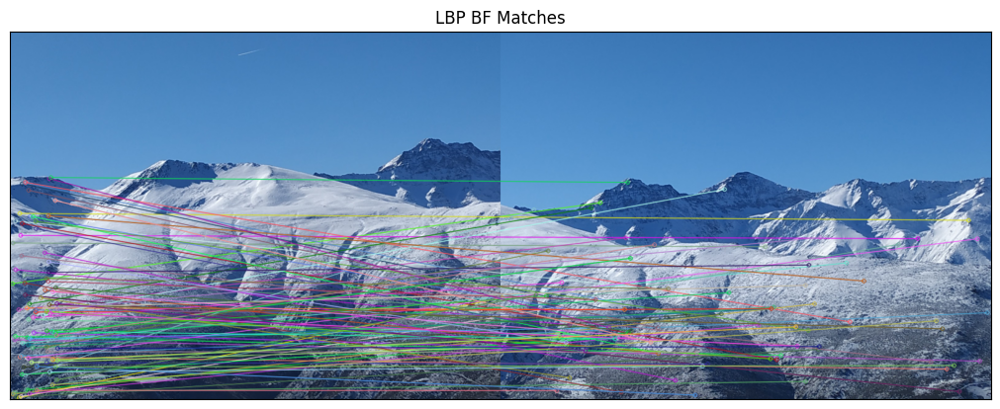

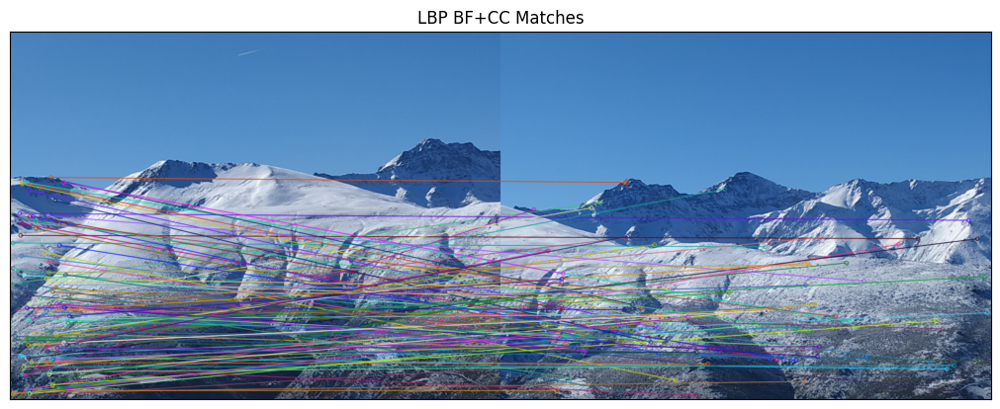

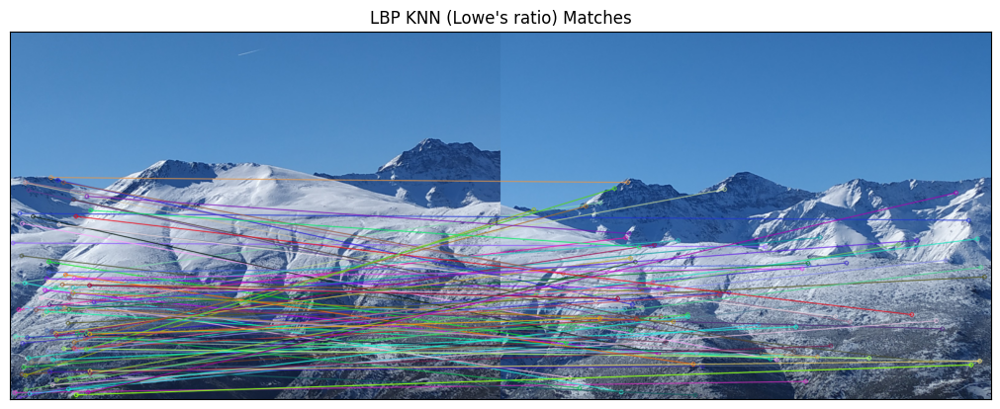

In [ ]:
numberOfmatches = 100

# Cargar y redimensionar imágenes
img1 = cv2.resize(readIm(get_image('IMG_20220312_102940_S.jpg'),1), (0,0), fx=0.5, fy=0.5)
img2 = cv2.resize(readIm(get_image('IMG_20220312_102944_S.jpg'),1), (0,0), fx=0.5, fy=0.5)

# Convertir a escala de grises
im1_gray = cv2.cvtColor(img1, cv2.COLOR_RGB2GRAY)
im2_gray = cv2.cvtColor(img2, cv2.COLOR_RGB2GRAY)

# Obtener keypoints SIFT
kp1, ds1_sift = siftPoints(im1_gray)
kp2, ds2_sift = siftPoints(im2_gray)

# Ahora calculamos descriptores LBP usando las mismas keypoints (kp1, kp2)
ds1_lbp = compute_LBP_descriptors(im1_gray, kp1)  # Nx256
ds2_lbp = compute_LBP_descriptors(im2_gray, kp2)  # Nx256

# Nota: ds1_lbp y ds2_lbp son arrays Nx256. Para emparejar con BFMatcher, etc.,
# necesitamos que sean del tipo float32.
ds1_lbp = ds1_lbp.astype(np.float32)
ds2_lbp = ds2_lbp.astype(np.float32)

# Emparejamiento con BF
matches_BF_lbp = matching(ds1_lbp, ds2_lbp, FlagMode='BF')
showMatches(img1, kp1, img2, kp2, matches_BF_lbp, numberOfmatches, title='LBP BF Matches')

# Emparejamiento con BF+CC
matches_BFCC_lbp = matching(ds1_lbp, ds2_lbp, FlagMode='BF+CC')
showMatches(img1, kp1, img2, kp2, matches_BFCC_lbp, numberOfmatches, title='LBP BF+CC Matches')

# Emparejamiento con KNN (Lowe's ratio test)
matches_KNN_lbp = matching(ds1_lbp, ds2_lbp, FlagMode='KNN')
showMatches(img1, kp1, img2, kp2, matches_KNN_lbp, numberOfmatches, title="LBP KNN (Lowe's ratio) Matches")

#### **Análisis de los Resultados: Emparejamientos con Descriptores LBP**

---

## **1. LBP BF Matches**

### Descripción:
- Se han emparejado descriptores LBP utilizando el método Brute Force (BF).
- Este método compara directamente cada descriptor de la primera imagen con todos los descriptores de la segunda.

### Observaciones:
- Se observa una alta cantidad de matches, pero algunos no corresponden visualmente a características similares.
- Este comportamiento es típico de Brute Force sin validación cruzada, ya que no filtra matches inconsistentes.

### Conclusión:
- BF con descriptores LBP genera una densidad elevada de matches, pero incluye emparejamientos incorrectos, lo que podría afectar tareas posteriores como estimación de transformaciones.

---

## **2. LBP BF+CC Matches**


### Descripción:
- Utilizando BF con validación cruzada (BF+CC), se han eliminado los matches inconsistentes.
- Solo se aceptan matches que son consistentes en ambas direcciones (de la primera a la segunda imagen y viceversa).

### Observaciones:
- La cantidad de matches es menor en comparación con BF puro, pero los emparejamientos son más precisos.
- Los matches se concentran en regiones con características bien definidas y con mayor textura.

### Conclusión:
- BF+CC mejora significativamente la precisión de los matches, haciendo que el conjunto resultante sea más robusto para aplicaciones posteriores.

---

## **3. LBP KNN (Lowe's Ratio) Matches**

### Descripción:
- Se han emparejado descriptores LBP utilizando KNN (Lowe's Ratio Test).
- Este método filtra matches ambiguos comparando los dos vecinos más cercanos de cada descriptor.

### Observaciones:
- Los matches resultantes son los más confiables entre los tres métodos, debido a la efectividad del Lowe's Ratio Test para eliminar emparejamientos ambiguos.
- La cantidad de matches es comparable a la de BF+CC, pero con mayor precisión.

### Conclusión:
- KNN con Lowe's Ratio Test ofrece el mejor equilibrio entre cantidad y calidad de matches, siendo ideal para aplicaciones sensibles a errores.

---


## <font color='blue'>HOG (Histogram of oriented gradients)

<font color='blue'>Ahora hacemos lo mismo, pero con la implementación de HOG disponible en `skimage.feature`. Se deben emplear $9$ orientaciones, $8\times8$ pixels por celda, y $2\times2$ celdas por bloque (importante hacer _resize_ de la ventana/región de $7\times7$ al tamaño estándar de HOG: $64\times128$ pixels). ¿Cuál es la dimensionalidad de este vector de características y por qué?

### Cálculo de la Dimensionalidad del Vector HOG

#### Parámetros de la implementación de HOG

1. **9 orientaciones (bins)**:
   - Se calculan 9 direcciones discretas para los gradientes dentro de cada celda.

2. **8×8 píxeles por celda**:
   - Cada celda tiene un tamaño de 8x8 píxeles.

3. **2×2 celdas por bloque**:
   - Cada bloque está formado por un conjunto de 4 celdas (2x2).

4. **Tamaño de la ventana/región: 64×128 píxeles**:
   - La ventana o región de interés en la que se calcula el descriptor HOG tiene un tamaño estándar de 64x128 píxeles.

#### Cálculo de la Dimensionalidad

1. **Número de celdas**:
   - Dado que la ventana tiene un tamaño de 64x128 píxeles, y cada celda tiene un tamaño de 8x8 píxeles, el número de celdas en la dirección horizontal y vertical será:

     - Número de celdas horizontales:

$$
\frac{64}{8} = 8
$$
    - Número de celdas verticales:

$$
\frac{128}{8} = 16
$$
     - En total, el número de celdas será:

$$
8 \times 16 = 128
$$

2. **Número de bloques**:
   - Cada bloque está formado por 2 celdas en la dirección horizontal y 2 celdas en la dirección vertical, por lo que el número de bloques será:
     - Número de bloques horizontales:
       $$
       \frac{8}{2} = 4
       $$
     - Número de bloques verticales:
       $$
       \frac{16}{2} = 8
       $$
     - En total, el número de bloques será:
       $$
       4 \times 8 = 32
       $$

3. **Número de características por celda**:
   - Cada celda tiene un histograma de gradientes con 9 orientaciones (bins), lo que significa que cada celda tiene 9 características.

4. **Número de características por bloque**:
   - Cada bloque consta de 4 celdas (2x2), por lo que el número total de características por bloque será:
     $$
     4 \times 9 = 36
     $$
     - Es decir, cada bloque tiene 36 características.

5. **Dimensionalidad total del vector HOG**:
   - Como hay 32 bloques en total, y cada bloque tiene 36 características, la dimensionalidad total del vector HOG será:
     $$
     32 \times 36 = 1152
     $$

### Respuesta a la Pregunta

La **dimensionalidad del vector de características HOG** es **1152**.

Esto se debe a los siguientes motivos:

- En una ventana de 64x128 píxeles, tenemos 32 bloques (4 bloques horizontales y 8 bloques verticales).
- Cada bloque tiene 36 características (9 orientaciones por celda, y 4 celdas por bloque).
- Al multiplicar el número de bloques (32) por el número de características por bloque (36), obtenemos la dimensionalidad total de 1152 características.

Esto proporciona un descriptor HOG de 1152 dimensiones que captura los gradientes orientados en la región de interés de la imagen, lo que es útil para tareas de detección de objetos y clasificación.


### **Cálculo de Descriptores HOG y Emparejamientos**

---

## **Descripción de la Función `compute_HOG_descriptors`**

Esta función calcula descriptores HOG (Histogram of Oriented Gradients) basados en keypoints detectados previamente.

### **Pasos del Cálculo**

1. **Extraer la Región 7×7**:
   - Para cada keypoint, se recorta un parche cuadrado de `7×7` píxeles alrededor de la posición del keypoint.
   - Si el keypoint está cerca de los bordes, los límites de la ventana se ajustan para no salir del rango de la imagen.

2. **Redimensionar a 64×128**:
   - La región `7×7` se redimensiona al tamaño estándar de HOG (`64×128` píxeles) utilizando interpolación bilineal con `cv2.resize`.
   - Este tamaño es necesario porque HOG fue diseñado para trabajar con regiones de esta escala.

3. **Calcular el Vector HOG**:
   - Usamos la implementación de HOG de `skimage.feature.hog`.
   - Configuramos los parámetros clave:
     - `orientations=9`: Número de orientaciones del gradiente.
     - `pixels_per_cell=(8, 8)`: Tamaño de cada celda.
     - `cells_per_block=(2, 2)`: Número de celdas por bloque.
     - `block_norm='L2-Hys'`: Normalización del bloque.
   - El resultado es un vector de 3780 dimensiones para cada parche redimensionado.

4. **Almacenar Descriptores**:
   - Los descriptores HOG generados se almacenan en una lista.
   - Finalmente, la lista se convierte en un array de `numpy` con tipo `float32`.

---

In [ ]:
from skimage.feature import hog
import cv2
import numpy as np

def compute_HOG_descriptors(im_gray, kp, window_size=7):
    """
    Calcula descriptores HOG para cada keypoint.
    Pasos:
    - Extraer la región 7x7 alrededor del keypoint.
    - Redimensionar a 64x128.
    - Calcular HOG con 9 orientaciones, celdas 8x8, bloques 2x2.

    Retorna: array Nx3780 (N keypoints, 3780 características cada uno)
    """
    half_w = window_size // 2
    H, W = im_gray.shape

    # Parámetros HOG
    orientations = 9
    pixels_per_cell = (8,8)
    cells_per_block = (2,2)
    hog_size = 64,128  # width=64, height=128

    hog_descriptors = []

    for keypoint in kp:
        x, y = keypoint.pt
        x = int(round(x))
        y = int(round(y))

        # Recortar la región 7x7
        y1 = max(0, y - half_w)
        y2 = min(H, y + half_w + 1)
        x1 = max(0, x - half_w)
        x2 = min(W, x + half_w + 1)

        patch = im_gray[y1:y2, x1:x2]

        # Redimensionar el parche a 64x128
        patch_resized = cv2.resize(patch, hog_size, interpolation=cv2.INTER_LINEAR)

        # Calcular HOG
        # Nota: feature_vector=True para obtener un solo vector
        hog_vec = hog(patch_resized,
                      orientations=orientations,
                      pixels_per_cell=pixels_per_cell,
                      cells_per_block=cells_per_block,
                      block_norm='L2-Hys',  # Norma típica de HOG
                      transform_sqrt=False,
                      feature_vector=True)

        hog_descriptors.append(hog_vec)

    hog_descriptors = np.array(hog_descriptors, dtype=np.float32)
    return hog_descriptors

###**Cálculo de Descriptores HOG y Emparejamientos**

---

## **Flujo Completo**

### 1. **Cargar y Redimensionar Imágenes**
- Las imágenes se cargan desde su ruta y se redimensionan a la mitad (600×800 píxeles) utilizando `cv2.resize`.
- Este redimensionado reduce la carga computacional en etapas posteriores.

### 2. **Conversión a Escala de Grises**
- Las imágenes redimensionadas se convierten a escala de grises con `cv2.cvtColor`, ya que los descriptores HOG operan sobre imágenes en este formato.

### 3. **Detección de Keypoints con SIFT**
- Los keypoints se detectan utilizando la función `siftPoints`.
- Estos keypoints son los mismos que se usaron para calcular los descriptores LBP y SIFT, asegurando coherencia en las comparaciones.

### 4. **Cálculo de Descriptores HOG**
- Para cada keypoint detectado, se calcula un descriptor HOG de 3780 dimensiones utilizando `compute_HOG_descriptors`.
- El descriptor HOG incluye gradientes normalizados en bloques superpuestos, proporcionando robustez frente a cambios de iluminación y pequeñas deformaciones geométricas.

### 5. **Emparejamiento de Descriptores**
- Los descriptores HOG generados se emparejan utilizando tres métodos:
  - **BF (Brute Force)**: Compara cada descriptor de una imagen con todos los descriptores de la otra.
  - **BF+CC (Cross-Check)**: Filtra matches inconsistentes validando en ambas direcciones.
  - **KNN (Lowe's Ratio Test)**: Filtra matches ambiguos comparando los dos vecinos más cercanos.

### 6. **Visualización de Matches**
- Los matches detectados se visualizan utilizando `showMatches`, mostrando las conexiones entre keypoints en las dos imágenes.

---

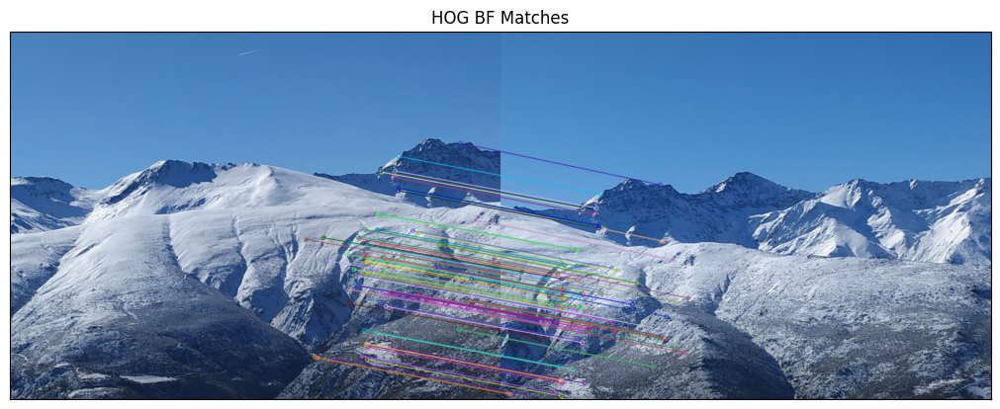

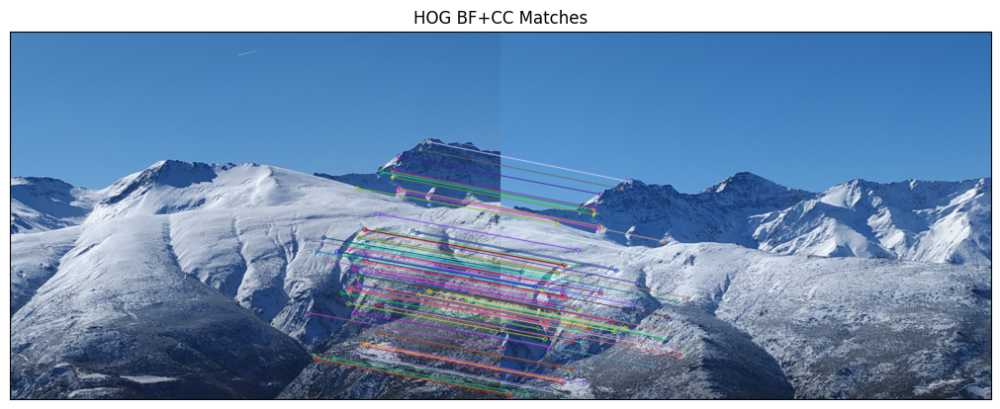

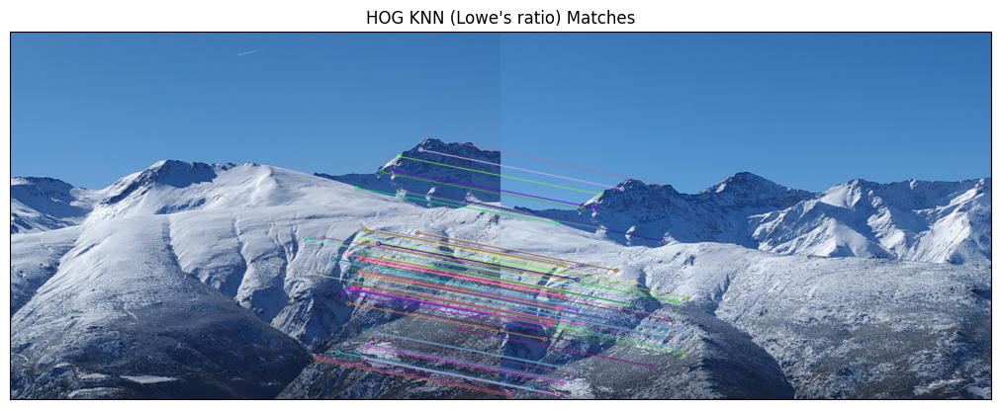

In [ ]:
numberOfmatches = 100

# Cargar y redimensionar imágenes
img1 = cv2.resize(readIm(get_image('IMG_20220312_102940_S.jpg'),1), (0,0), fx=0.5, fy=0.5)
img2 = cv2.resize(readIm(get_image('IMG_20220312_102944_S.jpg'),1), (0,0), fx=0.5, fy=0.5)

# Convertir a escala de grises
im1_gray = cv2.cvtColor(img1, cv2.COLOR_RGB2GRAY)
im2_gray = cv2.cvtColor(img2, cv2.COLOR_RGB2GRAY)

# Obtener keypoints SIFT (mismas que antes)
kp1, ds1_sift = siftPoints(im1_gray)
kp2, ds2_sift = siftPoints(im2_gray)

# Calcular descriptores HOG para esos keypoints
ds1_hog = compute_HOG_descriptors(im1_gray, kp1)  # Nx3780
ds2_hog = compute_HOG_descriptors(im2_gray, kp2)  # Nx3780

# Emparejamiento BF
matches_BF_hog = matching(ds1_hog, ds2_hog, FlagMode='BF')
showMatches(img1, kp1, img2, kp2, matches_BF_hog, numberOfmatches, title='HOG BF Matches')

# Emparejamiento BF+CC
matches_BFCC_hog = matching(ds1_hog, ds2_hog, FlagMode='BF+CC')
showMatches(img1, kp1, img2, kp2, matches_BFCC_hog, numberOfmatches, title='HOG BF+CC Matches')

# Emparejamiento KNN (Lowe's ratio test)
matches_KNN_hog = matching(ds1_hog, ds2_hog, FlagMode='KNN')
showMatches(img1, kp1, img2, kp2, matches_KNN_hog, numberOfmatches, title="HOG KNN (Lowe's ratio) Matches")


### **Análisis de los Resultados: Emparejamientos con Descriptores HOG**

---

## **1. HOG BF Matches**


### Descripción:
- Se han emparejado los descriptores HOG utilizando el método Brute Force (BF).
- Este método compara directamente cada descriptor de una imagen con todos los de la otra.

### Observaciones:
- La densidad de matches es alta, pero incluye emparejamientos incorrectos.
- Muchos matches conectan puntos que no parecen corresponder visualmente en las imágenes.

### Conclusión:
- Aunque el método BF genera una gran cantidad de matches, la precisión es baja debido a la falta de validación cruzada.

---

## **2. HOG BF+CC Matches**


### Descripción:
- Este método emplea BF con validación cruzada (BF+CC).
- Solo se aceptan matches consistentes en ambas direcciones, lo que elimina emparejamientos inconsistentes.

### Observaciones:
- La cantidad de matches es menor en comparación con BF puro, pero los emparejamientos son más confiables.
- Los matches se concentran en áreas de mayor textura y contraste.

### Conclusión:
- BF+CC mejora significativamente la precisión, ofreciendo un conjunto más robusto de matches.

---

## **3. HOG KNN (Lowe's Ratio Test) Matches**


### Descripción:
- Utiliza el Lowe's Ratio Test para filtrar matches ambiguos.
- Se seleccionan los matches más confiables comparando los dos vecinos más cercanos de cada descriptor.

### Observaciones:
- Este método proporciona matches de alta precisión con una cantidad moderada.
- Los emparejamientos son los más robustos entre los tres métodos, con muy pocos errores visibles.

### Conclusión:
- KNN con Lowe's Ratio Test es el método más efectivo para emparejar descriptores HOG, equilibrando cantidad y calidad.

---

## **Reflexión**
- Los descriptores HOG destacan por su capacidad para capturar características basadas en gradientes, siendo robustos frente a cambios de iluminación.
- Sin embargo, el método de emparejamiento utilizado influye significativamente en la calidad de los matches:
  - **BF**: Alta densidad, pero baja precisión.
  - **BF+CC y KNN**: Mejoran la precisión al filtrar emparejamientos inconsistentes o ambiguos.

---


<font color='blue'> ¿Cuál de los descriptores anteriores parece más adecuado para _keypoint matching_ y por qué?

## **Análisis Comparativo de Descriptores**

---

## **1. SIFT (Scale-Invariant Feature Transform)**

### **Ventajas:**
- **Invariante a escala y rotación**: Detecta y describe características robustas frente a cambios de escala y rotación.
- **Descriptores ricos**: Basados en histogramas de gradientes en celdas, lo que captura la orientación y textura de manera efectiva.
- **Calidad de matches**: Con métodos robustos como KNN y BF+CC, genera emparejamientos precisos incluso en escenas complejas.

### **Desventajas:**
- **Computacionalmente costoso**: Generar descriptores y emparejarlos es más lento en comparación con LBP y HOG.
- **Menos robusto a cambios bruscos de iluminación**.

---

## **2. LBP (Local Binary Patterns)**

### **Ventajas:**
- **Simplicidad**: Rápido de calcular y eficiente en términos computacionales.
- **Robustez local**: Funciona bien en texturas finas o imágenes con características homogéneas.

### **Desventajas:**
- **No invariante a escala ni rotación**: Los keypoints detectados no se adaptan a cambios significativos en escala o rotación.
- **Descriptores menos ricos**: Su representación mediante histogramas de patrones binarios locales es limitada en comparación con SIFT y HOG.
- **Precisión moderada**: Aunque se logran matches razonables, no son tan confiables como los de SIFT o HOG.

---

## **3. HOG (Histogram of Oriented Gradients)**

### **Ventajas:**
- **Robustez frente a cambios de iluminación**: Los gradientes normalizados ofrecen invariancia parcial a iluminación.
- **Descriptores ricos**: Captura la información de gradientes locales en bloques, lo que lo hace efectivo para imágenes con texturas y bordes prominentes.
- **Buen equilibrio de matches**: Con métodos como KNN, genera matches precisos.

### **Desventajas:**
- **No invariante a escala**: Requiere ventanas de tamaño fijo (`64×128`), lo que puede limitar su adaptabilidad.
- **Computacionalmente más costoso que LBP**.

---

## **Conclusión**

### **¿Cuál es el descriptor más adecuado?**
El **descriptor SIFT** parece ser el más adecuado para el emparejamiento de keypoints debido a:

1. **Invariancia a escala y rotación**:
   - SIFT es capaz de detectar y emparejar puntos de interés incluso cuando las imágenes tienen diferentes escalas u orientaciones, lo cual es esencial en muchas aplicaciones prácticas.

2. **Calidad de los Matches**:
   - Genera matches confiables y robustos cuando se combina con métodos como KNN o BF+CC.

3. **Descriptores Ricos**:
   - Los descriptores de SIFT capturan más información sobre la orientación y textura, lo que mejora la discriminación entre keypoints.

### **¿Cuándo elegir LBP o HOG?**
- **LBP**: Si se busca simplicidad y eficiencia en términos computacionales, especialmente en imágenes con texturas homogéneas.
- **HOG**: Ideal para escenarios donde los gradientes son críticos (e.g., bordes prominentes) y los cambios de iluminación deben manejarse de manera efectiva.

---


# <font color='blue'>**Ejercicio 3:** Creación de panoramas/mosaicos (_Image Stitching_) empleando homografías (5 puntos)

<font color='blue'>Ahora vamos a calcular homografías entre imágenes y usarlas para construir un mosaico/panorama. Para calcular la homografía entre dos imágenes, hay que llamar a la función `cv2.findHomography()`, que toma como entrada las listas de _keypoints_ y los matches/emparejamientos encontrados. Se debe usar RANSAC para realizar una estimación robusta.

## **Creación de Panoramas utilizando Homografías**

---

## **Descripción del Ejercicio**

El objetivo es calcular homografías entre dos imágenes utilizando los keypoints detectados y los emparejamientos generados en ejercicios anteriores. Posteriormente, estas homografías se utilizarán para alinear las imágenes y construir un mosaico o panorama.

---

## **Pasos del Cálculo**

### **1. Emparejamiento de Keypoints**
- Se reutilizan los keypoints detectados y los matches calculados con descriptores (SIFT, LBP o HOG) en ejercicios anteriores.
- Los matches seleccionados son los más confiables, obtenidos mediante métodos como BF+CC o KNN (Lowe's Ratio Test).

---

### **2. Cálculo de la Homografía**
- La homografía se calcula utilizando la función `cv2.findHomography()`, que toma como entrada:
  - Puntos fuente (`src_pts`): Coordenadas de los keypoints en la primera imagen.
  - Puntos destino (`dst_pts`): Coordenadas correspondientes de los keypoints en la segunda imagen.
  - Método de estimación: Se utiliza **RANSAC** para estimar una homografía robusta.
  - Parámetro `Ransac_Error`: Define el umbral de reproyección para RANSAC.

- **Salida de la función `findHomography`**:
  - Matriz de homografía (`H`): Una matriz `3×3` que transforma puntos de la primera imagen al espacio de coordenadas de la segunda.
  - Máscara (`mask`): Indicadores binarios que muestran qué matches fueron clasificados como inliers por RANSAC.

---

### **3. Validación de Matches**
- Se define un umbral mínimo (`MIN_MATCH_COUNT`) de keypoints emparejados para proceder con el cálculo de la homografía.
- Si el número de matches es insuficiente, se notifica al usuario con un mensaje de error.

---


In [ ]:
# this function computes a homography
def homography(kp1, kp2, matches, Ransac_Error, MIN_MATCH_COUNT=20):
    if len(matches) > MIN_MATCH_COUNT:
        # Extraer puntos (x,y) de los keypoints que hacen match
        src_pts = np.float32([kp1[m.queryIdx].pt for m in matches]).reshape(-1,1,2)
        dst_pts = np.float32([kp2[m.trainIdx].pt for m in matches]).reshape(-1,1,2)

        # Calcular la homografía usando RANSAC
        H, mask = cv2.findHomography(src_pts, dst_pts, cv2.RANSAC, Ransac_Error)
        return H
    else:
        print('Error - very few matches')
        return None

<font color='blue'>Para componer el mosaico necesitamos realizar los siguientes pasos:

> <font color='blue'>a) Escoger un tamaño máximo para el lienzo/canvas sobre el que vamos a pegar y "encajar" todas las imágenes (tamaño que depende del número de imágenes a unir/componer y sus dimensiones).

> <font color='blue'>b) Escoger la imagen central que dará los ejes al mosaico (que debemos escoger con criterio, de cara a mejorar la calidad final del mosaico).

> <font color='blue'>c) Establecer el orden de cada imagen respecto a la central (es decir, podemos asumir que, a priori, conocemos la posición de cada imagen en la serie de imágenes tomadas y, como consecuencia, conocemos qué imágenes están a la derecha y/o a la izquierda de otras; en otras palabras, conocemos el orden en que fueron tomadas las fotografías en el movimiento de izquierda a derecha sacando la panorámica).

> <font color='blue'>d) Calculamos la homografía para copiar la imagen central en el lienzo (que es solamente una traslación).

> <font color='blue'>e) A continuación debemos ir leyendo las imágenes de izquierda a derecha, y debemos calcular la homografía entre cada par de imágenes consecutivas.

> <font color='blue'>f) Con la información anterior, debemos componer la homografía entre cada imagen y el lienzo/canvas. Es decir, la matriz que lleva cada imagen/foto a su posición correcta en el lienzo.

> <font color='blue'>g) Ahora, debemos utilizar las homografías calculadas para transportar las imágenes al lienzo (por medio de la función `cv2.warpPerspective()`). Es importante ir de fuera hacia dentro, es decir, desde los extremos hasta el centro, pegando en último término la imagen central, que es la que presentará un menor grado de deformación.

> <font color='blue'>i) Finalmente, debemos eliminar las regiones negras de los bordes del canvas para mejorar la calidad final del mosaico.

<font color='blue'>Se debe componer el mosaico de Sierra Nevada con las imágenes `IMG_20220312_102934_S.jpg`, `IMG_20220312_102937_S.jpg`, `IMG_20220312_102940_S.jpg`, `IMG_20220312_102942_S.jpg`, `IMG_20220312_102944_S.jpg`, `IMG_20220312_102946_S.jpg`, `IMG_20220312_102948_S.jpg`, `IMG_20220312_102950_S.jpg`, `IMG_20220312_102951_S.jpg`, `IMG_20220312_102954_S.jpg`, y `IMG_20220312_102957_S.jpg`. Se recomienda operar con ellas con la mitad de resolución. Es decir, se debe hacer un resize para emplear imágenes de la mitad de filas y columnas del tamaño original.


## **Cálculo de Homografías Locales: Función `computeLocalHomographies`**

---

## **Descripción General**
La función `computeLocalHomographies` calcula las homografías entre pares consecutivos de imágenes en una lista ordenada. Estas homografías permiten relacionar las coordenadas de cada imagen con la siguiente, lo que es esencial para construir un mosaico o panorama.

---

## **Entradas**
1. **`images`**:
   - Lista de imágenes en escala de grises. Estas imágenes deben estar ordenadas de izquierda a derecha o según el orden en que se tomaron.

2. **`method`**:
   - Método para el emparejamiento de descriptores:
     - `"KNN"`: Utiliza el Lowe's Ratio Test.
     - `"BF"` o `"BF+CC"`: Alternativas basadas en fuerza bruta.

3. **`Ransac_Error`**:
   - Umbral de reproyección para el método RANSAC, que se utiliza para estimar homografías robustas eliminando emparejamientos incorrectos.

4. **`MIN_MATCH_COUNT`**:
   - Número mínimo de matches necesarios para calcular una homografía válida.

---

## **Salidas**
1. **`H_local`**:
   - Lista de homografías entre imágenes consecutivas:
     - `H_local[i]` transforma coordenadas de la imagen `i` a la imagen `i+1`.

2. **`kp_list`**:
   - Lista de keypoints detectados en cada imagen.

3. **`ds_list`**:
   - Lista de descriptores generados a partir de los keypoints.

---


In [ ]:
def computeLocalHomographies(images, method='KNN', Ransac_Error=5.0, MIN_MATCH_COUNT=20):
    # Asumiremos que las imágenes se dan en orden, por ejemplo: [I0, I1, I2, ..., In]
    # Calculamos homografías entre I0->I1, I1->I2, etc.

    # Detectar keypoints y descriptores para todas las imágenes
    kp_list = []
    ds_list = []
    for im in images:
        kp, ds = siftPoints(im)
        kp_list.append(kp)
        ds_list.append(ds)

    H_local = []  # homografías entre consecutivas
    for i in range(len(images)-1):
        # Matching entre descriptores ds_list[i] y ds_list[i+1]
        matches = matching(ds_list[i], ds_list[i+1], FlagMode=method)
        # Calcular homografía i->i+1
        H_ = homography(kp_list[i], kp_list[i+1], matches, Ransac_Error, MIN_MATCH_COUNT)
        H_local.append(H_)

    # H_local[k] es la homografía que lleva imagen k a k+1
    return H_local, kp_list, ds_list

## Descripción de la función `mosaicHomographies`

La función `mosaicHomographies` calcula las homografías globales necesarias para transformar un conjunto de imágenes hacia una imagen central, identificada por el índice `idx`. Las homografías locales, almacenadas en `H_local`, describen cómo transformar una imagen en la siguiente imagen (i.e., de la imagen `i` a la imagen `i+1`). La tarea de esta función es calcular las homografías que transforman cada imagen hacia la imagen central `idx`.

## Proceso general

La función realiza lo siguiente:
1. Inicializa un arreglo de homografías globales.
2. Para la imagen central, establece la homografía como identidad.
3. Calcula las homografías para las imágenes a la izquierda de la imagen central.
4. Calcula las homografías para las imágenes a la derecha de la imagen central.
5. Devuelve el conjunto de homografías globales.


In [ ]:
def mosaicHomographies(H_local, idx):
    """
    Calcula las homografías globales que transforman las imágenes hacia la imagen central (idx).

    H_local[i] transforma la imagen i a la imagen i+1. Necesitamos las homografías relativas a la imagen central (idx).

    La idea es calcular las homografías para todas las imágenes de la siguiente manera:
    - H(idx->idx) = I (identidad)
    - H(idx-1->idx) = H_local[idx-1]
    - H(idx-2->idx) = H_local[idx-2] * H_local[idx-1]
    - H(idx+1->idx) = inv(H_local[idx])
    - H(idx+2->idx) = inv(H_local[idx]) * inv(H_local[idx+1]) ...
    """
    n = len(H_local) + 1  # Número total de imágenes
    H_global = [None] * n

    # La imagen central: identidad
    H_global[idx] = np.eye(3)

    # Hacia la izquierda (i < idx)
    for i in range(idx-1, -1, -1):
        # Calculamos la homografía para cada imagen i -> idx
        if H_global[i+1] is not None and H_local[i] is not None:
            # i -> idx = H_global[i+1] * H_local[i]
            H_global[i] = H_global[i+1] @ H_local[i]

    # Hacia la derecha (i > idx)
    for i in range(idx+1, n):
        # Primero calculamos idx -> i acumulando las homografías locales
        if i == idx + 1:
            idx_to_i = H_local[idx]
        else:
            idx_to_i = H_local[i-1] @ idx_to_i

        # Luego calculamos i -> idx invirtiendo las homografías
        H_global[i] = np.linalg.inv(idx_to_i)

    return H_global


## Descripción de la función `axesHomography`

La función `axesHomography` calcula una homografía que transforma las coordenadas de una imagen a un lienzo de tamaño específico. El objetivo es centrar la imagen en el lienzo (canvas), de modo que la imagen esté ubicada en el centro del lienzo.

### Parámetros:
- **`sizeim`**: Una tupla que representa el tamaño de la imagen en formato `(alto, ancho)`, donde `sizeim[0]` es la altura y `sizeim[1]` es el ancho de la imagen.
- **`sizecanvas`**: Una tupla que representa el tamaño del lienzo en formato `(alto, ancho)`, donde `sizecanvas[0]` es la altura y `sizecanvas[1]` es el ancho del lienzo.

### Funcionamiento:

La función construye una matriz de homografía `H` de tamaño 3x3, donde:
- La matriz de homografía tiene la forma estándar para una transformación de 2D a 2D en un espacio proyectivo, es decir:
  ```python
  H = [[a, b, tx],
       [c, d, ty],
       [0, 0, 1]]
```
a, b, c, d son parámetros de la matriz de transformación (en este caso, no se modifican, ya que se mantiene la identidad en la transformación lineal).
tx y ty son los desplazamientos en las coordenadas x y y para centrar la imagen.

### Cálculo de la homografía:
La función se basa en los siguientes cálculos:

La imagen se va a mover de manera que quede centrada en el lienzo.
El desplazamiento en el eje x (tx) es la diferencia entre la mitad del ancho del lienzo y la mitad del ancho de la imagen.
El desplazamiento en el eje y (ty) es la diferencia entre la mitad de la altura del lienzo y la mitad de la altura de la imagen.

In [ ]:
def axesHomography(sizeim,sizecanvas):
  H=np.eye(3)
  H[0,2]=sizecanvas[1]//2-sizeim[1]//2
  H[1,2]=sizecanvas[0]//2-sizeim[0]//2
  return H

## Funciones Auxiliares

A continuación se describen dos funciones auxiliares utilizadas para trabajar con imágenes y lienzos.

## 1. `setCanvas`

Esta función crea un lienzo (canvas) vacío de un tamaño especificado, y puede ser en color (3 canales) o en escala de grises (1 canal) según el valor del parámetro `flagColor`.

### Parámetros:
- **`row`**: Número de filas (alto) del lienzo.
- **`col`**: Número de columnas (ancho) del lienzo.
- **`flagColor`**: Un indicador de si el lienzo debe ser en color o en escala de grises:
  - **1**: Crea un lienzo en color (3 canales: RGB).
  - **0**: Crea un lienzo en escala de grises (1 canal).
- **`nim` (opcional)**: Un parámetro adicional que no se usa en esta función. Puede ser utilizado en el futuro si se añaden más funcionalidades.

### Funcionalidad:

- Si `flagColor == 1`, la función crea un lienzo negro en color (con 3 canales: RGB).
- Si `flagColor == 0`, la función crea un lienzo negro en escala de grises (con un solo canal).

## 2. `blackOut`
Esta función recorta la parte de la imagen que contiene información relevante, eliminando los píxeles redundantes (negros o de fondo). Esto se logra mediante un enmascarado de los píxeles no nulos, y luego calculando el rectángulo delimitador de la región relevante.

### Parámetros:
  - **`img`**: La imagen de entrada que se va a recortar.
  - **`offset`** (opcional): Un valor que permite agregar un margen adicional en el recorte (por defecto es 0).

### Funcionalidad:
  - Si la imagen tiene 3 canales (es una imagen en color), primero se convierte a escala de grises.
  - Se genera una máscara donde los píxeles con valor mayor que 0 se consideran relevantes.
  - Se calcula el rectángulo delimitador de la máscara, que es la parte de la imagen que contiene información no nula.
  - Se recorta la imagen utilizando este rectángulo delimitador, y el resultado se devuelve con el posible offset aplicado.

In [ ]:
def setCanvas(row,col,flagColor,nim=2):
    # Crea un lienzo (canvas) negro del tamaño indicado
    # flagColor=1 -> lienzo en color 3 canales
    # flagColor=0 -> lienzo en escala de grises 1 canal
    if flagColor == 1:
        canvas = np.zeros((row,col,3), dtype=np.uint8)
    else:
        canvas = np.zeros((row,col), dtype=np.uint8)
    return canvas

def blackOut(img, offset=0):
  if len(img.shape)==3:
    im =cv2.cvtColor(img,cv2.COLOR_RGB2GRAY)
    mask = np.array((im > 0), np.uint8)
    x,y,w,h=cv2.boundingRect(mask)
    return img[y+offset:y+h-offset,x+offset:x+w-offset,:]
  else:
    mask = np.array((img > 0), np.uint8)
    x,y,w,h=cv2.boundingRect(mask)
    return img[y+offset:y+h-offset,x+offset:x+w-offset]

## Descripción de la función `composeMosaic`

La función `composeMosaic` es responsable de componer un mosaico de imágenes sobre un lienzo (canvas), utilizando una lista de homografías que describen cómo alinear cada imagen en relación con una imagen central. La función se encarga de aplicar las transformaciones necesarias y combinar las imágenes en el lienzo de manera adecuada.

### Parámetros:
- **`images`**: Una lista de imágenes que se utilizarán para componer el mosaico.
- **`canvas`**: El lienzo (canvas) sobre el cual se pegarán las imágenes. Este lienzo se crea utilizando la función `setCanvas()`.
- **`H`**: Una lista de homografías que describen cómo llevar cada imagen a la imagen central. Estas homografías se obtienen mediante las funciones `computeLocalHomographies()` y `mosaicHomographies()`.
- **`idx`**: El índice de la imagen central en la lista `images`.
- **`H0`**: La homografía de traslación que lleva la imagen central al lienzo, obtenida mediante la función `axesHomography()`.

### Estrategia:
1. **Orden de pegado de las imágenes**:
   - Las imágenes se pegarán en el lienzo siguiendo un orden específico: primero las imágenes a la izquierda de la imagen central (en orden descendente), luego las imágenes a la derecha (en orden ascendente), y finalmente la imagen central.
   
2. **Cálculo de homografías para cada imagen**:
   - Para cada imagen `i`, se calcula la homografía desde la imagen `i` al lienzo utilizando la fórmula:
     
$$
H_i = H_0 \times H[i]
$$
     
     
Donde `H0` es la homografía que lleva la imagen central al lienzo, y `H[i]` es la homografía que lleva la imagen `i` a la imagen central.

3. **Aplicación de la homografía**:
   - Se aplica la homografía `Hi` utilizando `cv2.warpPerspective` para transformar la imagen `i` al lienzo.

4. **Pegado de la imagen en el lienzo**:
   - Una vez que la imagen está transformada, se combina con el lienzo. Los píxeles no negros (es decir, los píxeles relevantes de la imagen) se copian al lienzo.


In [ ]:
def composeMosaic(images, canvas, H, idx, H0):
    """
    Compone el mosaico en el lienzo (canvas).
    Parámetros:
    - images: lista de imágenes (color)
    - canvas: lienzo sobre el que se pegarán las imágenes
    - H: lista de homografías imagen->imagen central
    - idx: índice de la imagen central
    - H0: homografía de traslación para colocar la imagen central en el lienzo

    Estrategia:
    1. Crear una lista de índices de imágenes en el orden que se van a pegar.
       Por ejemplo, primero las más a la izquierda (en orden descendente),
       luego las más a la derecha (en orden ascendente), y por último la central.
    2. Para cada imagen 'i', calcular la homografía al lienzo: Hi = H0 @ H[i]
    3. warpear la imagen i con cv2.warpPerspective
    4. Pegarlas en el lienzo
    5. Finalmente, retorna el lienzo resultante.
    """

    n = len(images)
    # Orden de pegado:
    # Primero las de la izquierda de idx, del más lejano al más cercano
    # Luego las de la derecha de idx, del más lejano al más cercano
    # Finalmente la central.

    left_indices = list(range(idx-1, -1, -1))   # imágenes a la izquierda (en orden descendente de idx)
    right_indices = list(range(idx+1, n))       # imágenes a la derecha
    # Pegamos primero las más lejanas al centro, luego acercándonos
    order = left_indices + right_indices + [idx]

    h_canvas, w_canvas = canvas.shape[:2]

    for i in order:
        # Calcular homografía hacia el lienzo
        # H[i] es imagen i -> imagen central
        # H0 es imagen central -> lienzo
        # Por lo tanto, imagen i -> lienzo = H0 @ H[i]
        Hi = H0 @ H[i]

        warp = cv2.warpPerspective(images[i], Hi, (w_canvas,h_canvas))

        # Combinar sobre el lienzo: allí donde warp no es negro, se copia al lienzo
        if len(warp.shape) == 3:
            # Color
            mask = (warp[:,:,0]>0)|(warp[:,:,1]>0)|(warp[:,:,2]>0)
            canvas[mask] = warp[mask]
        else:
            # Gris
            mask = (warp > 0)
            canvas[mask] = warp[mask]

    return canvas

<font color='blue'>Se debe mostrar la composición, paso a paso, del canvas, es decir, el canvas a medida que se le van incorporando cada una de las imágenes, así como la composición final del mosaico. Finalmente, se debe comparar el resultado de nuestra composición manual con el _stitcher_ de OpenCV: `cv2.Stitcher`.

<font color='blue'>Al igual que en todas las demás entregas y ejercicios, resulta fundamental documentar el trabajo realizado, y explicar pausadamente todas las etapas implementadas (qué se ha hecho, cómo se ha hecho, y por qué se ha hecho así).

## 1. Preparación de las imágenes

En esta sección, se cargan las imágenes desde el directorio especificado, se redimensionan a la mitad de su tamaño y se convierten a escala de grises para preparar los descriptores para el cálculo de las homografías.



In [ ]:
PREFIX = 'IMG_20220312_1029'
nameImages = ['34_S.jpg','37_S.jpg','40_S.jpg','42_S.jpg','44_S.jpg','46_S.jpg','48_S.jpg','50_S.jpg','51_S.jpg','54_S.jpg','57_S.jpg']

images = []
for item in nameImages:
    img = readIm(get_image(PREFIX+item), flagColor=1)
    img = cv2.resize(img, (0,0), fx=0.5, fy=0.5)
    images.append(img)

# Convertimos las imágenes a escala de grises para extraer keypoints SIFT
images_gray = [cv2.cvtColor(im, cv2.COLOR_RGB2GRAY) for im in images]


## 2. Selección de la imagen central y cálculo de homografías locales

Aquí seleccionamos la imagen central del conjunto y calculamos las homografías locales entre imágenes consecutivas. Las homografías locales son necesarias para alinear las imágenes antes de componer el mosaico.




In [ ]:
# Seleccionamos la imagen central
n = len(images)
idx = n//2  # índice de la imagen central

# Calculamos las homografías locales entre pares consecutivos
H_local, kp_list, ds_list = computeLocalHomographies(images_gray, method='KNN', Ransac_Error=5.0)


## 3. Cálculo de las homografías globales

En esta sección, calculamos las homografías globales, que transforman todas las imágenes hacia la imagen central. Esto es necesario para alinearlas correctamente en el lienzo.



In [ ]:
# Calculamos las homografías globales (imagen->imagen central)
H_global = mosaicHomographies(H_local, idx)


## 4. Definición del tamaño del lienzo

Aquí se define el tamaño del lienzo sobre el que se colocarán las imágenes. El tamaño del lienzo depende del número de imágenes y sus solapamientos. Para este ejemplo, se elige un tamaño grande y luego se recortará al final.




In [ ]:
# Definir el tamaño del canvas.
# Necesitamos un lienzo suficientemente grande para colocar todas las imágenes.
# Esto dependerá de cuántas imágenes hay a la izquierda/derecha y sus solapamientos.
# A modo de ejemplo, escogemos un tamaño grande y luego recortamos con blackOut al final.
height, width = images_gray[idx].shape
# Suponemos, por ejemplo, que el lienzo tenga:
canvas_height = height * 3
canvas_width = width * (len(images))
# Estas dimensiones son estimativas. Ajustar según sea necesario.
canvas = setCanvas(canvas_height, canvas_width, flagColor=1, nim=n)


## 5. Cálculo de la homografía de ejes

Calculamos la homografía de ejes que coloca la imagen central en el centro del lienzo. Esto asegura que la imagen central se alinee correctamente en la composición final.



In [ ]:
# Calculamos la homografía de ejes para colocar la imagen central en el centro del lienzo
H0 = axesHomography((height,width), (canvas_height,canvas_width))


## 6. Composición manual del mosaico

En esta sección, las imágenes se colocan una por una en el lienzo, siguiendo un orden definido. Primero se colocan las imágenes a la izquierda de la imagen central, luego las de la derecha, y finalmente la imagen central.


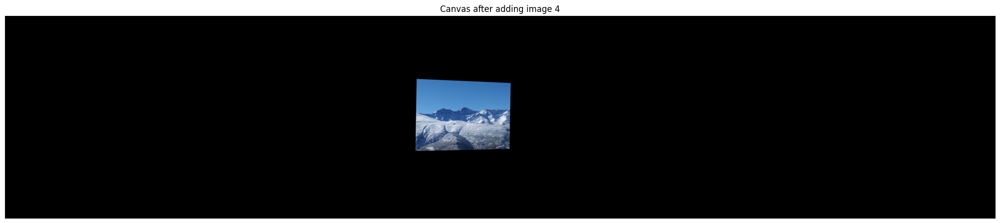

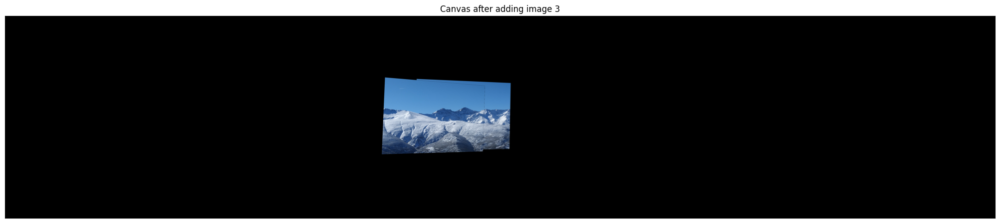

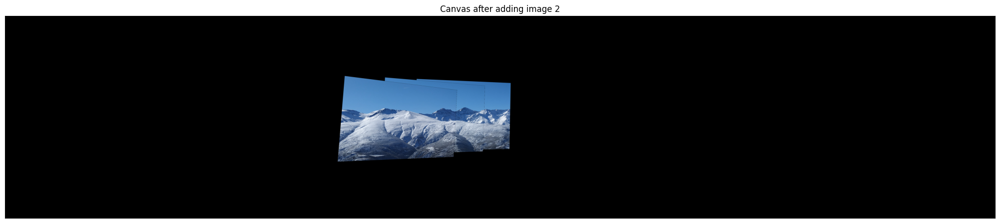

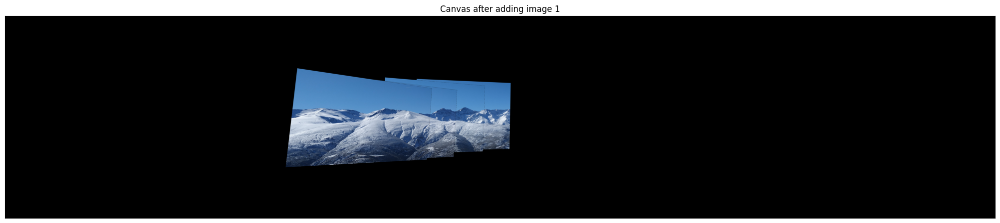

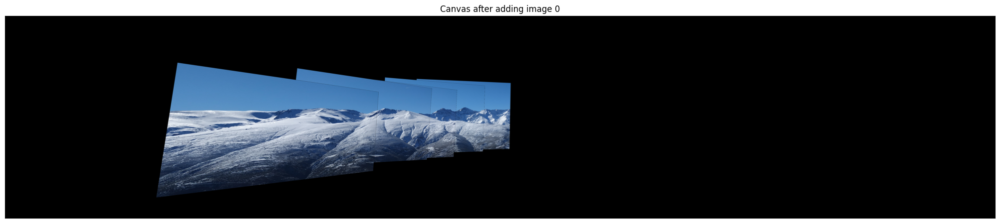

...

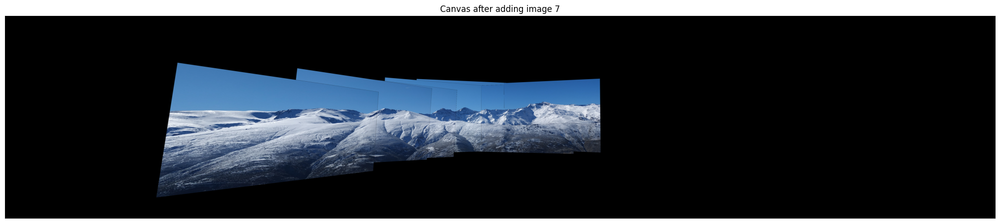

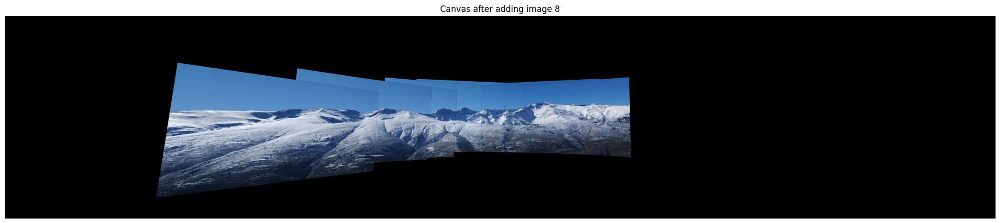

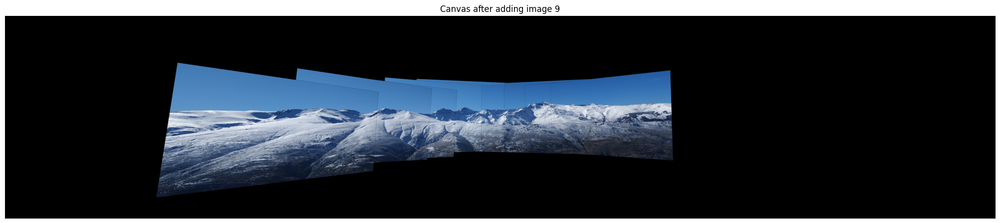

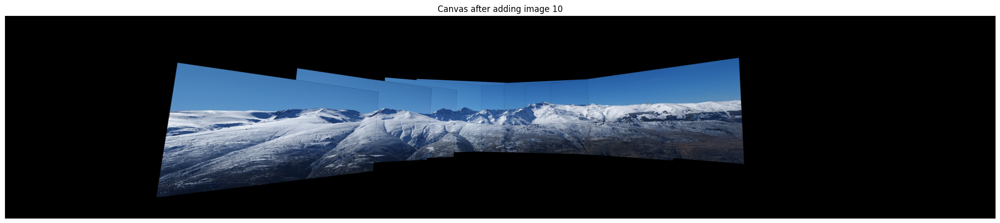

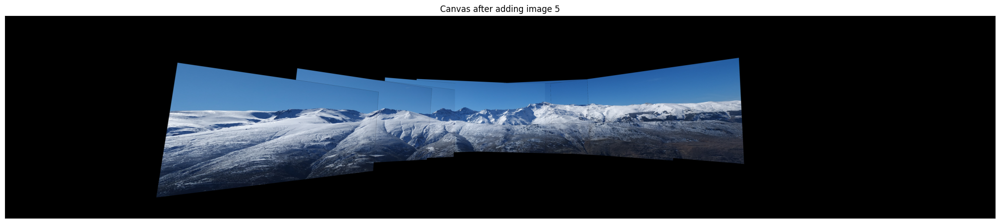

In [ ]:
# Para visualizar el proceso paso a paso, podemos modificar la función composeMosaic
# o bien hacerlo manualmente. Aquí mostramos cómo hacerlo manualmente
# pegando las imágenes una a una siguiendo el orden definido.

# Orden seguido: primero las más alejadas a la izquierda, luego a la derecha, y por último la central.
left_indices = list(range(idx-1, -1, -1))
right_indices = list(range(idx+1, n))
order = left_indices + right_indices + [idx]

h_canvas, w_canvas = canvas.shape[:2]

# Pegamos imágenes una a una en el canvas, mostrando el progreso
for i, index_img in enumerate(order):
    Hi = H0 @ H_global[index_img]
    warp = cv2.warpPerspective(images[index_img], Hi, (w_canvas,h_canvas))

    # Combinar sobre el canvas
    mask = (warp[:,:,0]>0)|(warp[:,:,1]>0)|(warp[:,:,2]>0)
    canvas[mask] = warp[mask]

    # Mostrar el canvas parcial
    displayIm(canvas, title=f"Canvas after adding image {index_img}", factor=4)


## 7. Mostrar el lienzo completo antes del recorte

Aquí mostramos el lienzo completo con todas las imágenes colocadas, antes de aplicar el recorte para eliminar los bordes negros.


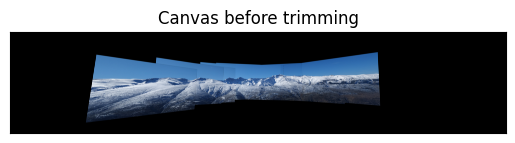

In [ ]:
# Al terminar, mostramos el canvas completo antes del recorte
displayIm(canvas, title="Canvas before trimming", factor=1)


## 8. Recorte de bordes negros

En esta sección, utilizamos la función `blackOut` para recortar los bordes negros del lienzo, dejando solo la parte relevante del mosaico.



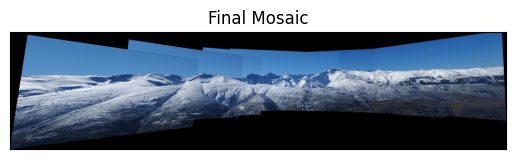

In [ ]:
# Recortamos los bordes negros con blackOut
final_mosaic = blackOut(canvas, offset=5)
displayIm(final_mosaic, title="Final Mosaic", factor=1)

## 9. Comparación con el Stitcher de OpenCV

Finalmente, comparamos el mosaico generado manualmente con el resultado obtenido utilizando el `Stitcher` de OpenCV, un algoritmo automático para la creación de mosaicos.



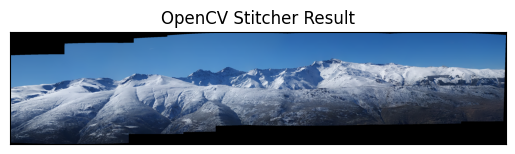

In [ ]:
# Comparación con el stitcher de OpenCV
stitcher = cv2.Stitcher_create(cv2.STITCHER_PANORAMA)
# El stitcher espera una lista de imágenes (BGR), así que convertimos de RGB a BGR
images_bgr = [cv2.cvtColor(im, cv2.COLOR_RGB2BGR) for im in images]

status, stitched = stitcher.stitch(images_bgr)
if status == cv2.STITCHER_OK:
    # Convertir stitched a RGB para mostrar
    stitched_rgb = cv2.cvtColor(stitched, cv2.COLOR_BGR2RGB)
    displayIm(stitched_rgb, title="OpenCV Stitcher Result", factor=1)
else:
    print("Stitcher failed with status:", status)

### Comparación entre la Implementación Manual y el Resultado del Stitcher de OpenCV

En este caso, hemos generado un mosaico manualmente utilizando homografías y comparado el resultado con el generado por el `Stitcher` de OpenCV. A continuación, se presentan los dos resultados para su comparación.

### 1. **Mosaico Final (Implementación Manual)**

- **Descripción**: El mosaico generado manualmente mediante el cálculo de homografías entre imágenes consecutivas y su alineación con la imagen central presenta un resultado donde las imágenes se ensamblan una a una. Este proceso permite tener un control más preciso sobre la alineación de las imágenes, aunque puede resultar en bordes no perfectamente alineados.
  
- **Ventajas**:
  - **Mayor control**: Al trabajar con homografías manualmente, puedes ajustar la alineación de cada imagen.
  - **Flexible**: Puedes modificar el flujo de trabajo o los parámetros según sea necesario.

- **Desventajas**:
  - **Posibles bordes no suaves**: Dependiendo de las homografías calculadas, puede haber distorsiones o bordes duros entre las imágenes, que requieren ajustes adicionales.
  - **Proceso más lento**: Este enfoque es más manual y puede ser más lento que un algoritmo automatizado.

### 2. **Resultado de OpenCV Stitcher**

- **Descripción**: El `Stitcher` de OpenCV automatiza el proceso de ensamblado de las imágenes. Utiliza un enfoque basado en la detección automática de características y el cálculo de homografías para alinear las imágenes. El resultado es un mosaico generado rápidamente.

- **Ventajas**:
  - **Rapidez**: Es más rápido y automatizado, ideal para aplicaciones que requieren procesamiento en tiempo real.
  - **Consistencia**: El algoritmo de OpenCV puede manejar automáticamente los solapamientos y las transiciones entre las imágenes, proporcionando un resultado bastante consistente.

- **Desventajas**:
  - **Menor control**: No se tiene tanto control sobre la alineación de las imágenes, lo que puede generar algunos errores en casos complejos de solapamiento.
  - **Menos flexible**: Si se desea ajustar parámetros específicos, el control es más limitado que con un enfoque manual.

### 3. **Comparación Visual**

- **Mosaico Manual**: En este caso, el mosaico tiene bordes visibles y posibles distorsiones entre algunas imágenes debido a las homografías calculadas. Sin embargo, el control manual permite ajustar cada paso para obtener el resultado deseado.
  
- **Mosaico OpenCV**: El `Stitcher` ofrece una solución rápida y más limpia, aunque a veces puede haber pequeñas inconsistencias en las áreas donde las imágenes se solapan, especialmente si el solapamiento no es perfecto o si las imágenes tienen diferencias significativas en las características.

### Conclusión

- **Si se busca un resultado rápido y consistente**, el `Stitcher` de OpenCV es una excelente opción.
- **Si se busca un control detallado sobre la alineación de las imágenes** y se necesita ajustar parámetros o manejar solapamientos complejos, la implementación manual puede ser más adecuada.
